<a href="https://colab.research.google.com/github/hungcuongthan/ML_Learning/blob/main/CuongTHAN_Airlines_Arrivals_Classification_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1. Proplem Description and Objective of the project:**

A plane landing late is not uncommon, but the problem is how much later than scheduled.

In this notebook I will only classify flights as late if the actual arrival time is 30 minutes more than scheduled one.

**Problem to be solved:** We are asked to complete the exploratory analysis to get a better sense in what sorts of flights are likely to be late more than 30 minutes.

  And then based on what we studied, it's our job to create a binary classication model to predict whether a flight will be late for more than 30 minutes or not.

Notebook created by: Cuong Than

Other notebooks for references: to be added 

Data source: http://stat-computing.org/dataexpo/2009/the-data.html

# **2. Import packets and collect data**



In [ ]:
import pandas as pd
import glob
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
from scipy import stats

# !pip install --upgrade plotly
# !pip install jupyter_dash
"""Plotly visualization."""
from plotly.subplots import make_subplots
from plotly.offline import iplot, init_notebook_mode
# init_notebook_mode(connected = True) # Required to use plotly offline in jupyter notebook
import plotly.graph_objects as go
import plotly.express as px
# from jupyter_dash import JupyterDash
# import dash_core_components as dcc
# import dash_html_components as html
# from dash.dependencies import Input, Output 

import warnings
warnings.filterwarnings("ignore")

from scipy.stats import chisquare

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFE
from sklearn.metrics import confusion_matrix
from sklearn import metrics

from sklearn.metrics import roc_curve, roc_auc_score #Compute Area Under the Receiver Operating Characteristic Curve (ROC AUC) from prediction scores

"""Machine learning models."""
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier

#Advanced models
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
import lightgbm as lgb

# !pip install shap
import shap

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import glob

path = r'/content/drive/MyDrive/CBD - Test/Airlines Arrivals Project/data'
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

df = pd.concat(li, axis=0, ignore_index=True)

In [ ]:
df.shape

(7213446, 61)

The original dataset has more than 7m observations with more than 60 features

In [ ]:
# Randomly take 7% of total number observations from the dataset to reduce the number of observations.
df = df.sample(frac = 0.07, random_state = 1)

In [ ]:
df.shape

(504941, 61)

In [ ]:
df1 = df.copy()

In [ ]:
#Drop unneccessary columns
df1.drop(columns = ['YEAR','OP_UNIQUE_CARRIER','OP_CARRIER_AIRLINE_ID','ORIGIN_AIRPORT_SEQ_ID','ORIGIN_CITY_MARKET_ID','ORIGIN_STATE_NM','DEST_AIRPORT_SEQ_ID','DEST_CITY_MARKET_ID','DEST_STATE_NM','FL_DATE','ORIGIN_AIRPORT_ID','DEST_AIRPORT_ID','DEP_TIME','DEP_DELAY','DEP_DELAY_NEW','DEP_DEL15','DEP_DELAY_GROUP','DEP_TIME_BLK','TAXI_OUT','WHEELS_OFF','WHEELS_ON','TAXI_IN','ARR_TIME','ARR_DELAY_NEW','ARR_DEL15','ARR_DELAY_GROUP','ARR_TIME_BLK','CANCELLATION_CODE','ACTUAL_ELAPSED_TIME','AIR_TIME','CARRIER_DELAY','WEATHER_DELAY','NAS_DELAY','SECURITY_DELAY','LATE_AIRCRAFT_DELAY','FIRST_DEP_TIME','TOTAL_ADD_GTIME','LONGEST_ADD_GTIME','FLIGHTS','DISTANCE_GROUP','Unnamed: 60'],axis = 1, inplace = True)

In [ ]:
#'OP_CARRIER_FL_NUM',

df1.shape

(504941, 20)

Our dataset now has unprocessed 18 columns.

**Preview of our dataset**

In [ ]:
df1.head(5)

,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,DEST,DEST_CITY_NAME,DEST_STATE_ABR,CRS_DEP_TIME,CRS_ARR_TIME,ARR_DELAY,CANCELLED,DIVERTED,CRS_ELAPSED_TIME,DISTANCE
695058,1,2,5,1,F9,N313FR,1947,CVG,"Cincinnati, OH",KY,TPA,"Tampa, FL",FL,745,1003,18.0,0.0,0.0,138.0,773.0
713732,1,2,16,5,MQ,N652RS,3599,DFW,"Dallas/Fort Worth, TX",TX,XNA,"Fayetteville, AR",AR,1100,1216,-9.0,0.0,0.0,76.0,280.0
929508,1,2,4,7,AA,N567UW,1729,MCO,"Orlando, FL",FL,CLT,"Charlotte, NC",NC,1359,1544,-12.0,0.0,0.0,105.0,468.0
2867757,2,5,2,3,YX,N132HQ,4655,PHL,"Philadelphia, PA",PA,SYR,"Syracuse, NY",NY,1555,1714,12.0,0.0,0.0,79.0,228.0
4896810,3,9,14,5,DL,N307DQ,2642,CLT,"Charlotte, NC",NC,ATL,"Atlanta, GA",GA,1700,1820,-26.0,0.0,0.0,80.0,226.0


In [ ]:
 #lowering case for column names
df1.columns= df1.columns.str.strip().str.lower()
df1.columns

Index(['quarter', 'month', 'day_of_month', 'day_of_week', 'op_carrier',
       'tail_num', 'op_carrier_fl_num', 'origin', 'origin_city_name',
       'origin_state_abr', 'dest', 'dest_city_name', 'dest_state_abr',
       'crs_dep_time', 'crs_arr_time', 'arr_delay', 'cancelled', 'diverted',
       'crs_elapsed_time', 'distance'],
      dtype='object')



---



# **3. Original Variables description and identification**

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 504941 entries, 695058 to 6911811
Data columns (total 20 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   quarter            504941 non-null  int64  
 1   month              504941 non-null  int64  
 2   day_of_month       504941 non-null  int64  
 3   day_of_week        504941 non-null  int64  
 4   op_carrier         504941 non-null  object 
 5   tail_num           503883 non-null  object 
 6   op_carrier_fl_num  504941 non-null  int64  
 7   origin             504941 non-null  object 
 8   origin_city_name   504941 non-null  object 
 9   origin_state_abr   504941 non-null  object 
 10  dest               504941 non-null  object 
 11  dest_city_name     504941 non-null  object 
 12  dest_state_abr     504941 non-null  object 
 13  crs_dep_time       504941 non-null  int64  
 14  crs_arr_time       504941 non-null  int64  
 15  arr_delay          495286 non-null  float64
 

Summary of names and meanings of the features:
- **quarter**
- **month**
- **day_of_month**
- **day_of_week**
- **op_carriers**: IATA code of carrier/airlines **(2-letter code)**
- **tail_num**: plane (aircraft) tail number (example: N567DL)	
  <u>N</u>: usually stands for the US, The US already had radio rights to “N”, “W” and “K”.

  <u>567</u>: specific number for planes from a same airlines.

  <u>DL</u>:  Many airlines use their two-letter code at the end of their registrations, hence Delta jets that end in DL.
  But this might not be the case in many situations, when airlines can use different 2-letter code instead of their airline codes.

- **op_carrier_fl_num**: Flight number, different from plane tail number. (for example: VN997)
- **origin**: origin's IATA airport code **(3-letter code)**
- **dest**: desitnation's IATA airport code **(3-letter code)**
- **crs_dep_time**: Computerized Reservations Systems (CRS)/Estimated Departure time **(hh:mm)**
- **crs_arr_time**: (CRS)/Estimated Arrival time **(hh:mm)**
- **arr_delay**: Delay time **(Minutes)**
- **distance**: Flight distance (in miles)
- **cancelled**: = 1 when the flight was cancelled **(0 or 1)**
- **diverted**: = 1 when the destination had been changed **(0 or 1)**
- **crs_elapsed_time**: Estimated Elapsed time. **(Minutes)**
    
    Actual time an airplane spends in the air, as opposed to time spent taxiing to and from the gate and during stopovers.
    https://www.travel-industry-dictionary.com/elapsed-flying-time.html

Geographic features:
- **origin_city_name**
- **origin_state_abr**
- **dest_city_name**
- **dest_state_abr**

**Data types of our varibles:**

1. **Time related: (6)** quarter, month, day_of_month, day_of_week, crs_dep_time, crs_arr_time

2. **Float data type: (4)** arr_delay, cancelled, diverted, crs_elapsed_time

3. **Object data type: (10)** op_carrier, origin, dest, origin_city_name, origin_state_abr, dest, dest_city_name, dest_state_abr, tail_num, op_carrier_fl_num

In [ ]:
df1.isnull().sum()

quarter                 0
month                   0
day_of_month            0
day_of_week             0
op_carrier              0
tail_num             1058
op_carrier_fl_num       0
origin                  0
origin_city_name        0
origin_state_abr        0
dest                    0
dest_city_name          0
dest_state_abr          0
crs_dep_time            0
crs_arr_time            0
arr_delay            9655
cancelled               0
diverted                0
crs_elapsed_time        1
distance                0
dtype: int64

In [ ]:
#Drop observations which doesn't have arrival delay time

df1.dropna(subset=['arr_delay','tail_num'],inplace = True)

In [ ]:
df1.isnull().sum()

quarter              0
month                0
day_of_month         0
day_of_week          0
op_carrier           0
tail_num             0
op_carrier_fl_num    0
origin               0
origin_city_name     0
origin_state_abr     0
dest                 0
dest_city_name       0
dest_state_abr       0
crs_dep_time         0
crs_arr_time         0
arr_delay            0
cancelled            0
diverted             0
crs_elapsed_time     0
distance             0
dtype: int64

In [ ]:
#Drop cancelled and diverted flights since these information can not be obtained beforehand.
df1= df1[(df1['cancelled'] == 0) & (df1['diverted'] == 0)]

In [ ]:
df1.drop(columns= 'cancelled',inplace= True)
df1.drop(columns= 'diverted',inplace= True)

In [ ]:
#Create categorical targeted variable for our classification project
df1['is_late'] = df1['arr_delay'].apply(lambda x: 1 if x > 30 else 0)

#Drop numerical arrival delay variable, we will focus solely on our categorical target variable.
df1.drop(columns= 'arr_delay',inplace= True)

# **4. Univariate Analysis**

Analyze and explore the distribution the variables on their owns, without mentioning the other variables.

## 4.1. Object variables:

In [ ]:
df1.describe(include = "O")

,op_carrier,tail_num,origin,origin_city_name,origin_state_abr,dest,dest_city_name,dest_state_abr
count,495286,495286,495286,495286,495286,495286,495286,495286
unique,18,5663,356,350,52,357,351,52
top,WN,N488HA,ATL,"Chicago, IL",CA,ATL,"Chicago, IL",CA
freq,93096,278,26826,28855,54785,27033,28485,54736


<u>Findings:</u>
1. From the the table we can see, ATL is the airport that had the highest flight arrivals as both destination and origin.

  This seems to be reliable, according to Airports Council International's world traffic report, **Hartsfield–Jackson Atlanta International Airport (ATL)** was indeed the busiest airport not only in the US but also the world for the year of 2018. https://edition.cnn.com/travel/article/worlds-busiest-airports-2018/index.html


2. As a result, **Chicago and California** are the busiest city and state respectively


3. **WN** (SouthWest Airlines) seemed to dominate the market share in US, according to the data pubished by Bureau of Transportation Statistics for 2018. https://www.bts.dot.gov/newsroom/2018-traffic-data-us-airlines-and-foreign-airlines-us-flights

Notes: For **origin, origin_city_name, origin_state, dest, dest_city_name and dest_state**, the number of unique values of theses varibles is large.
We should explore them more and find a way to transform theses varibles 

In [ ]:
#@title
"""Create a function to plot a variable's absolute and relative frequency."""
def plotFrequency(variable):
    """Plots absolute and relative frequency of a avriable."""
    
    # Calculates absolute frequency
    absFreq = variable.value_counts()
    
    # Calculates relative frequency
    relFreq = variable.value_counts(normalize=True).round(4)*100
    
    # Creates a dataframe off absolute and relative frequency
    df = pd.DataFrame({
        "absoluteFrequency":absFreq,
        "relativeFrequency":relFreq
    })
    
    # Create two subplots of bar chart
    fig=make_subplots(
        rows=1, 
        cols=2,
        vertical_spacing=0.3,
        subplot_titles=("Absolute Frequency", "Relative Frequency"),
        print_grid=False) # This suppresses "This is the format of your plot grid:" text from popping out.

    # Add trace for absolute frequency
    fig.add_trace(
        go.Bar(
        y=df.index, 
        x=df.absoluteFrequency,
        orientation="h",
        text=df.absoluteFrequency,
        hoverinfo="x+y",
        textposition="auto", 
        name="Abs Freq",
        textfont=dict(family="sans serif",size=14),
        marker = dict(color=df.absoluteFrequency, colorscale="Teal")),
        row=1,
        col=1
        )

    # Add another trace for relative frequency
    fig.add_trace(
        go.Bar(y=df.index,
        x=df.relativeFrequency.round(2),
        orientation="h",
        text=df.relativeFrequency.round(2),
        hoverinfo="x+y",
        textposition="auto", 
        name="Rel Freq(%)",
        textfont=dict(family="sans serif",size=15),
        marker=dict(color=df.relativeFrequency.round(2), colorscale="Teal")),
        row=1,
        col=2
        )

    # Update the layout. Add title, dimension, and background color
    fig.layout.update(
        height=600, 
        width=970,
        hovermode="closest",
        title_text=f"Absolute and Relative Frequency of {variable.name}",showlegend=False,
        paper_bgcolor="rgb(215, 215, 213)",
        plot_bgcolor="rgb(215, 215, 213)"
        )

    # Set y-axis title in bold
    fig.layout.yaxis1.update(title=f"<b>{variable.name}</b>")
    
    # Set x-axes titles in bold
    fig.layout.xaxis1.update(title="<b>Abs Freq</b>")
    fig.layout.xaxis2.update(title="<b>Rel Freq(%)</b>")
    # or, fig["layout"]["xaxis2"].update(title="<b>Rel Freq(%)</b>")
    return fig.show()

### 4.1.1. Airlines

In [ ]:
#Number of unique carriers (airlines) in our dataset
df1['op_carrier'].value_counts().shape[0]

18

In [ ]:
plotFrequency(df1.op_carrier)

WN airline accounted for more than 18% of flights in 2018, out of 18 airlines in the US.

### 4.1.2. Late Arrivals

In [ ]:
plotFrequency(df1.is_late.apply(str))

On time arrived flights accounted for 88% of total observation in our dataset. 

We can say we are dealing with a **imbalance target variable**.

Which means that there are too few examples of the minority class, which is our positive (1) class in this case.

In [ ]:
#@title
"""#1.Create a function to plot histogram and density plot."""
def plotHistogram(variable):
    """Plots histogram and density plot of a variable."""
    
    # Create subplot object.
    fig = make_subplots(
        rows=1,
        cols=1,
        print_grid=False)
    
    # This is a count histogram
    fig.add_trace(
        go.Histogram( 
            nbinsx = 200,
            x = variable,
            # hoverinfo="x+y",
            marker = dict(color = "#318f91")
        ),
    row=1,col=1)
    
    # Update layout
    fig.layout.update(
        height=500, 
        width=1200,
        hovermode="closest",
        showlegend=False,
        paper_bgcolor="rgb(215, 215, 213)",
        plot_bgcolor="rgb(215, 215, 213)",
        title_text=f"Distribution of {variable.name} with Histogram "
        )
    
    # Update axes
    fig.layout.yaxis1.update(title="<b>Abs Frequency</b>")
    # fig.layout.xaxis2.update(title=f"<b>{variable.name}</b>")
    return fig.show()

### 4.1.3. Seasonal and time variables

**Month**

In [ ]:
plotFrequency(df1['month'].apply(str))

Summer months from **May to August** seemed to be peak seasons since number of operated flights was considerably higher than the other months.

**Departure time**

In [ ]:
plotHistogram(df1['crs_dep_time'])

Departure time saw the slightly similar type of distribution of number flights.

The number of flights departured gradually **decreased from 8pm to 4am**, then **increased again after 5am**, and **from 7am** the number of flights arrivals was kept at a relatively uniform level until the end of the day

**Arrival time**

In [ ]:
plotHistogram(df1['crs_arr_time'])

The number of flights landing gradually **decreased from 12pm to 4am**, then **increased again after 5am**, and **from 8am** the number of flights arrivals was kept at a relatively uniform level until the end of the day

## 4.2. Numerical variables:

In [ ]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df1[[ 'crs_elapsed_time','distance']].describe()

,crs_elapsed_time,distance
count,495286.00,495286.00
mean,141.58,804.37
std,73.69,600.67
min,21.00,31.00
25%,88.00,363.00
50%,122.00,639.00
75%,171.00,1038.00
max,703.00,4983.00


Findings:
- **Distance**: the summary statistics look acceptable, only the the minimum = 31 miles (50 kms) need more examination for outliers.

### 4.2.1. CRS Elapsed Time

We then check the actual elapsed of this specific flight and it was 182 minutes no where near 1 minute.

So this observation of crs_elapsed_time can be considered as an outlier, we will make sure to get rid of those observations like this one in the following sections.

In [ ]:
plotHistogram(df1['crs_elapsed_time'])

This crs_elapsed_time distribution histogram is right-skewed, which means there are multiple observations that have relatively very high value of crs elapsed time.

### 4.2.2. Distance

In [ ]:
plotHistogram(df1['distance'])

The distribution histogram of distance can be considered as right-skewed with a lot of extremely **long flights > 3000 miles (4000 kms).**

Also, there were **more than 22 observations with flight distance < 50 miles (81 kms)**

# **5. Detecting Outliers**

In this section, our job is to identify and get rid of outliers regarding 2 variables: **crs_elapsed_time and distance**

In [ ]:
# Detecting outliers for crs_elapsed_time variable
q1,q3 = df1['crs_elapsed_time'].quantile(0.25),df1['crs_elapsed_time'].quantile(0.75)
IQR = q3-q1
lowerlim = q1 - 1.5*IQR
upperlim = q3 + 1.5*IQR
print('Number of observations with outliers: {}'.format(df1.shape[0]))
print('Number of outliers: {}'.format(df1[(df1['crs_elapsed_time']<lowerlim) | (df1['crs_elapsed_time']>upperlim)].shape[0]))
print("{}%".format(round((df1[(df1['crs_elapsed_time']<lowerlim) | (df1['crs_elapsed_time']>upperlim)].shape[0])/(df1.shape[0])*100,2)))

Number of observations with outliers: 495286
Number of outliers: 27582
5.57%


In [ ]:
# distance
q1,q3 = df1['distance'].quantile(0.25),df1['distance'].quantile(0.75)
IQR = q3-q1
lowerlim_dist = q1 - 1.5*IQR
upperlim_dist = q3 + 1.5*IQR
print('Number of observations with outliers: {}'.format(df1.shape[0]))
print('Number of outliers: {}'.format(df1[(df1['distance']<lowerlim_dist) | (df1['distance']>upperlim_dist)].shape[0]))
print("{}%".format(round((df1[(df1['distance']<lowerlim_dist) | (df1['distance']>upperlim_dist)].shape[0])/(df1.shape[0])*100,2)))

Number of observations with outliers: 495286
Number of outliers: 30202
6.1%


In [ ]:
df1 = df1[(df1['crs_elapsed_time'] > lowerlim) & (df1['crs_elapsed_time']<upperlim)]
df1 = df1[(df1['distance']>lowerlim_dist) & (df1['distance']<upperlim_dist)]

In [ ]:
df1.shape

(463349, 18)

In [ ]:
print("After removing outliers we still retain {}% number of observations of the dataset".format(round((2649583/2830698)*100,2)))

After removing outliers we still retain 93.6% number of observations of the dataset


# **6. Multivariate analysis**

In this section, we will go through some of the varibles and look deeper into the relationship and impact it of them has on each other and especially on our target variable.

### 6.1. Airlines (carriers)

In [ ]:
airlate = df1[['op_carrier','is_late']].groupby('op_carrier').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'total',ascending = False)
airlate['ratio'] = round(airlate['num_late']/airlate['total'],2)
airlate.reset_index(inplace = True)
airlate

,index,op_carrier,total,num_late,ratio
0,15,WN,91466,9936,0.11
1,4,DL,60194,4881,0.08
2,1,AA,56467,7048,0.12
3,12,OO,52777,6441,0.12
4,13,UA,36236,4594,0.13
5,17,YX,21239,2484,0.12
6,9,MQ,19866,2521,0.13
7,11,OH,18549,2389,0.13
8,3,B6,17787,3405,0.19
9,0,9E,16474,2085,0.13


Number of flights operated by each airline droped dramatically as go for most popular airline to the less popular ones.

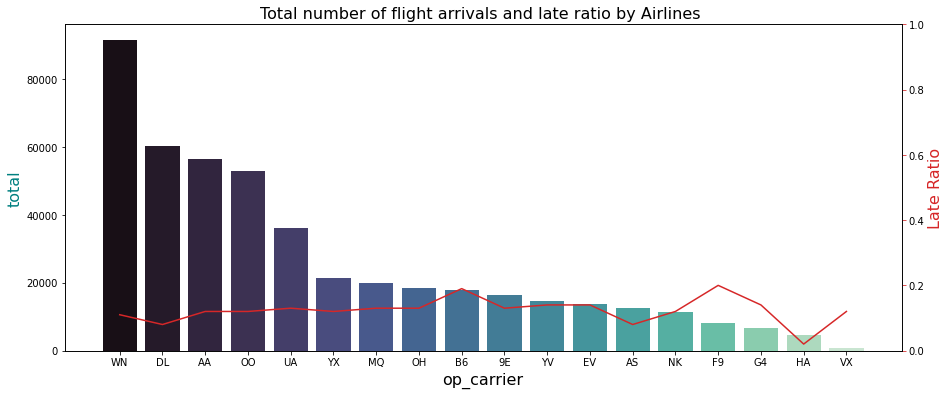

In [ ]:
fig, ax1 = plt.subplots(figsize=(15,6))
color = '#008080'
ax1.set_title('Total number of flight arrivals and late ratio by Airlines ', fontsize=16)
ax1.set_xlabel('Month', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='op_carrier', y='total', data = airlate, palette='mako')
ax1.tick_params(axis='y')
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='op_carrier', y='ratio', data = airlate, sort=False, color=color)
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

Findings: The late ratio in **big and most popular airlines** seemed to be well maintained and competitive among airlines.

For the relatively **medium and small sized airlines**, we see a big variation in late ratio.

Presumption: For the less popular airlines, they might have a very limited amount of resource, so they have to choose amongst priorities. For example: ticket price, delay time, service level, etc.

We can create new variable from this to categorize airlines into 2 categories, **big group and medium/small group of airlines**.

In [ ]:
airlate['total'].mean()

25741.61111111111

On average, an airlines completed around 25700 number of flights, this boundary seperate top 5 airlines from others.

We can choose upto **top 7**, as according to the graph, the performance of 6th and 7th airlines were still fairly good regarding late ratio.

In [ ]:
#Create new varible regarding airlines

d = pd.Series(airlate.index.values,index=airlate.op_carrier).to_dict()
df1['big_airline'] = df1['op_carrier'].apply(lambda x : 1 if d[x] <= 6 else 0)
df1['big_airline'].value_counts()

1    338245
0    125104
Name: big_airline, dtype: int64

I decide to keep airlines variable, no matter how many unique values it has, since this is one of the most important features when it comes to flight's performance.

In [ ]:
del airlate
del d

### 6.2. Origin and Destination

#### 6.2.1 Origins

In [ ]:
print('Number of unique origin airports: {}'.format(df1[['origin']].value_counts().shape[0]))

print('Number of unique origin cities: {}'.format(df1[['origin_city_name']].value_counts().shape[0]))

print('Number of unique origin states: {}'.format(df1[['origin_state_abr']].value_counts().shape[0]))

Number of unique origin airports: 355
Number of unique origin cities: 349
Number of unique origin states: 52


We can see **almost every city has only one airport**, so we can choose to keep one of them and delete the other.

In [ ]:
df1.drop(columns = 'origin_city_name',inplace = True)

In [ ]:
statelate = df1[['origin','is_late']].groupby('origin').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'total',ascending = False)
statelate['ratio'] = round(statelate['num_late']/statelate['total'],2)
statelate.reset_index(inplace = True)
statelate.head(3)

,index,origin,total,num_late,ratio
0,20,ATL,25827,2499,0.10
1,246,ORD,22724,3571,0.16
2,91,DFW,18986,2756,0.15


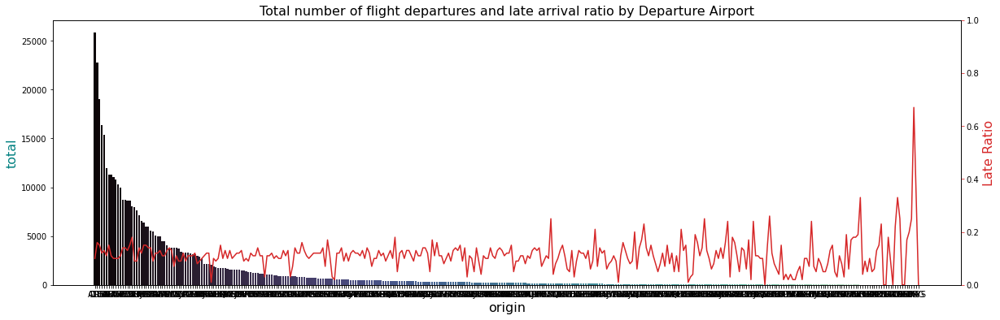

In [ ]:
#@title
fig, ax1 = plt.subplots(figsize=(20,6))
color = '#008080'
ax1.set_title('Total number of flight departures and late arrival ratio by Departure Airport', fontsize=16)
ax1.set_xlabel('Month', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='origin', y='total', data = statelate, palette='mako')
ax1.tick_params(axis='y')
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='origin', y='ratio', data = statelate, sort=False, color=color)
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

In [ ]:
q1,q2,q3 = statelate['total'].quantile(0.25),statelate['total'].quantile(0.5),statelate['total'].quantile(0.75)
print(q1)
print(q2)
print(q3)

61.5
216.0
823.5


From the combo chart, we can see there are there groups of airports with different levels of variation of late ratio.

The top airports seem to have **smaller variation of late ratio amongst the airports**.

The mid-tier airports with higher variation and then we have least popular airpotrs with highest variation of late ratio amongst member airports.

I decide to segment the departure airports into 3 groups based on what I can see on the graph and from the quantiles.

<u>Group</u> 1: Airports with Total number of departed flights **> 4,000**

<u>Group</u> 2: Airports with Total number of departed flights **>= 823**

<u>Group</u> 3: Airports with Total number of departed flights **< 823**

In [ ]:
statelate['dep_airport_group'] = statelate['total'].apply(lambda x: 1 if x >= 4000 else 2 if x >= 823 and x < 4000 else 3)
statelate['dep_airport_group'].value_counts()

3    266
2     57
1     32
Name: dep_airport_group, dtype: int64

We now separated departure airports into 3 groups, 266 in group 3, 57 in group 2, and 32 in group 1.

In [ ]:
# Number of completed flights per group
d = pd.Series(statelate.dep_airport_group.values,index=statelate.origin).to_dict()
df1['dep_airport_group'] = df1['origin'].apply(lambda x : d[x])
df1['dep_airport_group'].value_counts()

1    305485
2    107158
3     50706
Name: dep_airport_group, dtype: int64

In [ ]:
del statelate
del d

#### 6.2.2. Destinations

In [ ]:
print('Number of unique origin airports: {}'.format(df1[['dest']].value_counts().shape[0]))

print('Number of unique origin cities: {}'.format(df1[['dest_city_name']].value_counts().shape[0]))

print('Number of unique origin states: {}'.format(df1[['dest_state_abr']].value_counts().shape[0]))

Number of unique origin airports: 356
Number of unique origin cities: 350
Number of unique origin states: 52


We can see almost every city has only one airport, so we can choose to keep one of them and delete the other.

In [ ]:
df1.drop(columns = 'dest_city_name',inplace = True)

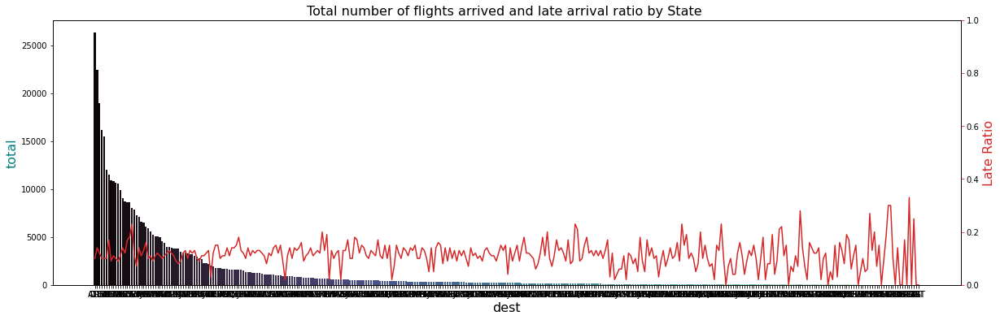

In [ ]:
#@title
statelate = df1[['dest','is_late']].groupby('dest').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'total',ascending = False)
statelate['ratio'] = round(statelate['num_late']/statelate['total'],2)
statelate.reset_index(inplace = True)
statelate.head(5)

fig, ax1 = plt.subplots(figsize=(20,6))
color = '#008080'
ax1.set_title('Total number of flights arrived and late arrival ratio by State ', fontsize=16)
ax1.set_xlabel('Month', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='dest', y='total', data = statelate, palette='mako')
ax1.tick_params(axis='y')
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='dest', y='ratio', data = statelate, sort=False, color=color)
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

In [ ]:
# statelate = df1[['dest','is_late']].groupby('dest').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'total',ascending = False)
# statelate['ratio'] = round(statelate['num_late']/statelate['total'],2)
# statelate.reset_index(inplace = True)
# # statelate.head(5)

In [ ]:
# q1,q2,q3 = statelate['total'].quantile(0.25),statelate['total'].quantile(0.5),statelate['total'].quantile(0.75)
# print(q1)
# print(q2)
# print(q3)

In [ ]:
# statelate['arr_airport_group'] = statelate['total'].apply(lambda x: 1 if x >= 1000 else 2 if x >= 207 and x < 1000 else 3)
# statelate['arr_airport_group'].value_counts()

In [ ]:
# # Separate Arrival airports into groups
# d = pd.Series(statelate.arr_airport_group.values,index=statelate.dest).to_dict()
# df1['arr_airport_group'] = df1['dest'].apply(lambda x : d[x])
# df1['arr_airport_group'].value_counts()

In [ ]:
# del statelate
# del d

#### 6.2.3. Routes

Since there airports that were much more busy than the others, we can expect some common routes to appear more ofter than others as a result.

A route: 

flight 1: ORD to LGA
flight 2: LGA to ORD

These 2 flights are considered to operate on a same route.

We will name the route by concatenate 2 airport name and order them ascendingly.

In [ ]:
droute = df1[['origin','dest']].value_counts().reset_index(name = 'count')
droute['route'] = droute.apply(lambda row: ''.join(sorted([row['origin'], row['dest']])), axis=1)
droute.head(10)

,origin,dest,count,route
0,LAX,SFO,1033,LAXSFO
1,LGA,ORD,1024,LGAORD
2,SFO,LAX,1014,LAXSFO
3,ORD,LGA,969,LGAORD
4,LAS,LAX,820,LASLAX
5,LAX,LAS,810,LASLAX
6,BOS,LGA,698,BOSLGA
7,HNL,OGG,698,HNLOGG
8,ATL,MCO,670,ATLMCO
9,OGG,HNL,661,HNLOGG


In [ ]:
droute = droute[['route','count']].groupby('route').agg(['sum']).droplevel(axis=1, level=0).reset_index().sort_values(by = 'sum', ascending = False)

In [ ]:
droute['sum'].mean()

160.16211545108882

On average, a route had 160 flights operated in 2018.

In [ ]:
# I will mark route which had more than 160 flights completed as busy_route (1).
droute['busy_route'] = droute['sum'].apply(lambda x : 1 if x > droute['sum'].mean() else 0)
droute.head()

,route,sum,busy_route
2188,LAXSFO,2047,1
2236,LGAORD,1993,1
2102,LASLAX,1630,1
1818,HNLOGG,1359,1
594,BOSLGA,1331,1


In [ ]:
droute['busy_route'].value_counts()

0    1931
1     962
Name: busy_route, dtype: int64

In [ ]:
#Create 'busy_route' variable in our dataset.
df1['route'] = df1.apply(lambda row: ''.join(sorted([row['origin'], row['dest']])), axis=1)
d = pd.Series(droute.busy_route.values,index=droute.route).to_dict()
df1['busy_route'] = df1['route'].apply(lambda x : d[x])
df1['busy_route'].value_counts()

1    352946
0    110403
Name: busy_route, dtype: int64

In [ ]:
del droute
del d
df1.drop(columns = 'route',inplace = True)

In [ ]:
r = df1[['busy_route','is_late']].groupby('busy_route').agg(['count','sum']).droplevel(axis = 1,level = 0).reset_index()
r['late_ratio'] = round(r['sum']/r['count'],2)
r

,busy_route,count,sum,late_ratio
0,0,110403,12820,0.12
1,1,352946,42075,0.12


We will create a new variable named **busy_route**, from the table, overall we can see there is a similar late ratio between busy routes group and the other group. 

We're going test the impact of this variable on our target variable in the hypothesis testing section.

In [ ]:
del r

### 6.3. Time related variables

#### 6.3.1. Quarter, month, day_of_month and day_of_week

In [ ]:
df1[['quarter','month','day_of_month','day_of_week']].head()

,quarter,month,day_of_month,day_of_week
695058,1,2,5,1
713732,1,2,16,5
929508,1,2,4,7
2867757,2,5,2,3
4896810,3,9,14,5


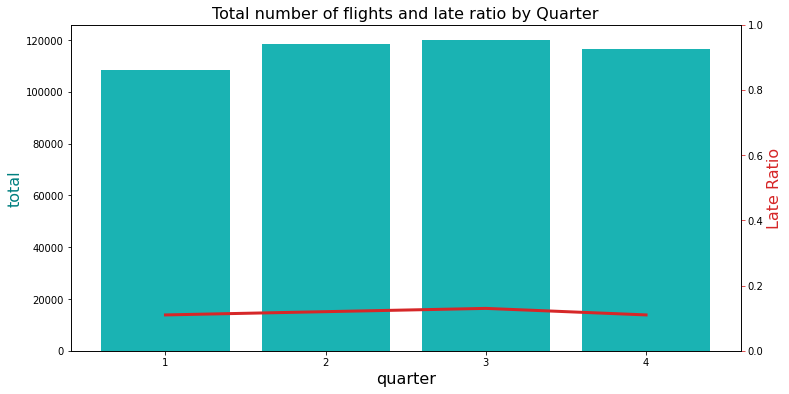

In [ ]:
#@title
quarterlate = df1[['quarter','is_late']].groupby('quarter').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'quarter',ascending = True)
quarterlate['ratio'] = round(quarterlate['num_late']/quarterlate['total'],2)
quarterlate['quarter'] = quarterlate.quarter.astype(str)
# quarterlate


fig, ax1 = plt.subplots(figsize=(12,6))
color = '#008080'
ax1.set_title('Total number of flights and late ratio by Quarter', fontsize=16)
ax1.set_xlabel('quarter', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='quarter', y='total', data = quarterlate, color = '#00cdcd')
ax1.tick_params(axis='y') 
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='quarter', y='ratio', data = quarterlate, sort=False, color=color,linewidth = 3 )
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

With the above graph we can there was no much a difference amongst the quarters, we still have to test this presumption in our hypothesis testing section.

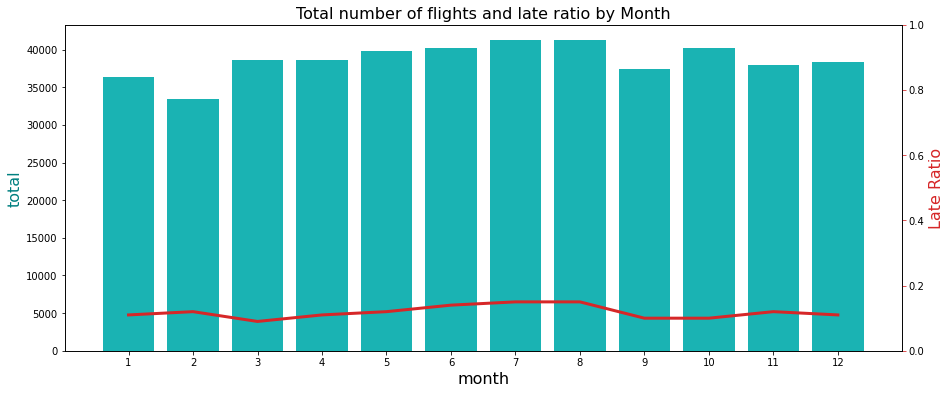

In [ ]:
#@title
quarterlate = df1[['month','is_late']].groupby('month').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'month',ascending = True)
quarterlate['ratio'] = round(quarterlate['num_late']/quarterlate['total'],2)
quarterlate['month'] = quarterlate.month.astype(str)
# quarterlate


fig, ax1 = plt.subplots(figsize=(15,6))
color = '#008080'
ax1.set_title('Total number of flights and late ratio by Month', fontsize=16)
ax1.set_xlabel('quarter', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='month', y='total', data = quarterlate, color = '#00cdcd')
ax1.tick_params(axis='y') 
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='month', y='ratio', data = quarterlate, sort=False, color=color,linewidth = 3 )
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

Amongst months, we can see for the **summer months**, both the <u>number of flights and the late ratio are higher</u> compared to the other months of the year.

Findings: **Summer to the end of the year.**
Consider deleting quarter quarter column since we already had the same trend in the month variable.

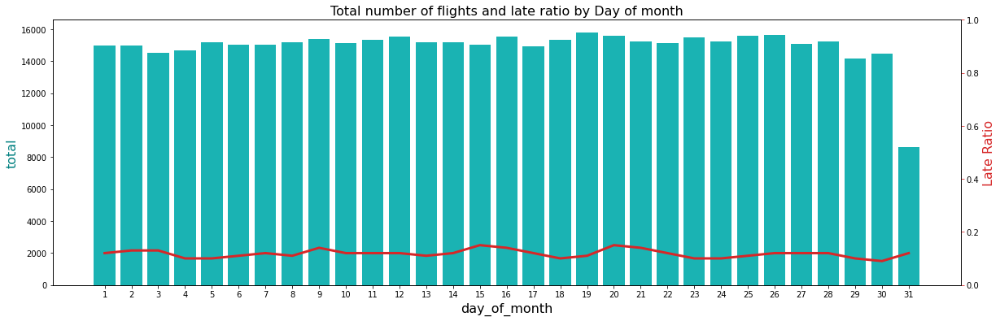

In [ ]:
#@title
quarterlate = df1[['day_of_month','is_late']].groupby('day_of_month').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'day_of_month',ascending = True)
quarterlate['ratio'] = round(quarterlate['num_late']/quarterlate['total'],2)
quarterlate['day_of_month'] = quarterlate.day_of_month.astype(str)
# quarterlate


fig, ax1 = plt.subplots(figsize=(20,6))
color = '#008080'
ax1.set_title('Total number of flights and late ratio by Day of month', fontsize=16)
ax1.set_xlabel('quarter', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='day_of_month', y='total', data = quarterlate, color = '#00cdcd')
ax1.tick_params(axis='y') 
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='day_of_month', y='ratio', data = quarterlate, sort=False, color=color,linewidth = 3 )
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

There's no big differences amongs flight days of the month, days from 15th to 20th seem to have a slightly higher number of flights and late ratio compared to the other days of month.

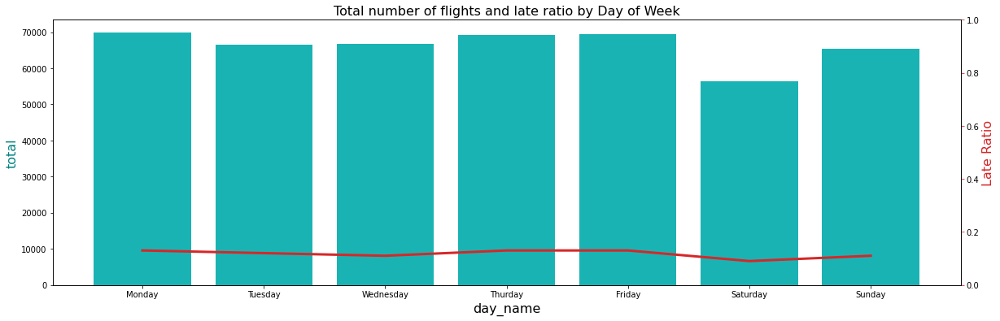

In [ ]:
#@title
quarterlate = df1[['day_of_week','is_late']].groupby('day_of_week').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'day_of_week',ascending = True)
quarterlate['ratio'] = round(quarterlate['num_late']/quarterlate['total'],2)
d = {1:'Monday',2:'Tuesday',3: 'Wednesday',4:'Thurday',5: 'Friday',6:'Saturday',7: 'Sunday'}
quarterlate['day_name'] = quarterlate['day_of_week'].apply(lambda x: d[x])
# quarterlate['day_of_month'] = quarterlate.day_of_month.astype(str)
# quarterlate


fig, ax1 = plt.subplots(figsize=(20,6))
color = '#008080'
ax1.set_title('Total number of flights and late ratio by Day of Week', fontsize=16)
ax1.set_xlabel('quarter', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='day_name', y='total', data = quarterlate, color = '#00cdcd')
ax1.tick_params(axis='y') 
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='day_name', y='ratio', data = quarterlate, sort=False, color=color,linewidth = 3 )
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

Thursday and Fridays seem to have higher number of completed flights and late ratio than other weekdays.

#### 6.3.2. Departure time and Arrival time

In [ ]:
df1[['crs_dep_time','crs_arr_time']].describe()

,crs_dep_time,crs_arr_time
count,463349.00,463349.00
mean,1324.00,1486.36
std,486.76,510.70
min,1.00,1.00
25%,915.00,1103.00
50%,1318.00,1512.00
75%,1730.00,1914.00
max,2359.00,2400.00


Min of both two columns is **1 instead of 100**

In [ ]:
df1['len_dep_hr'] = df1['crs_dep_time'].apply(lambda x: len(str(x)))
df1['len_dep_hr'].value_counts()

4    327871
3    134417
2      1000
1        61
Name: len_dep_hr, dtype: int64

Majority of our dataset has hour format **contains atleast 3 digits**, but there are some unexpected values with number of digits < 3 (around 6000 observations)

In [ ]:
#Drop observations with hour issue
df1 = df1[df1['len_dep_hr'] >= 3]

In [ ]:
df1['len_arr_hr'] = df1['crs_arr_time'].apply(lambda x: len(str(x)))
df1['len_arr_hr'].value_counts()

4    378386
3     77438
2      5087
1      1377
Name: len_arr_hr, dtype: int64

The same issue happened for arr_time.

Issue explained: 

- **Why we have 3 digits values:** If we have something like 1AM and 10mins: this will be represented by: 0110, in our dateset the first 0 will be cancelled out, so we have: **110**

- **Why we have 2 digits values:** flights have operation hour at 00:10 can be represented as 0010 then 2 first 0s will be cut, so we have only 2 digit number **10 instead of 0010**

- **why we have 1 digit values**:flights have operation hour at 00:07 can be represented as 0007 then 3 first 0s will be cut, so we have only 1 digit number **7 instead of 0007**

In [ ]:
df1.drop(columns = ['len_arr_hr','len_dep_hr'],inplace= True) 

In [ ]:
# I will only take the hour part from the raw values, and delete minute part.
df1['crs_dep_time'] = df1['crs_dep_time'].astype(str)
df1['crs_arr_time'] = df1['crs_arr_time'].astype(str)
df1['crs_dep_time'] = df1['crs_dep_time'].apply(lambda x: x[:2] if len(x) == 4 else x[:1] if len(x) == 3 else '24')
df1['crs_arr_time'] = df1['crs_arr_time'].apply(lambda x: x[:2] if len(x) == 4 else x[:1] if len(x) == 3 else '24')
df1['crs_dep_time'] = df1['crs_dep_time'].apply(lambda x: "0"+x if len(x) == 1 else x)
df1['crs_arr_time'] = df1['crs_arr_time'].apply(lambda x: "0"+x if len(x) == 1 else x)

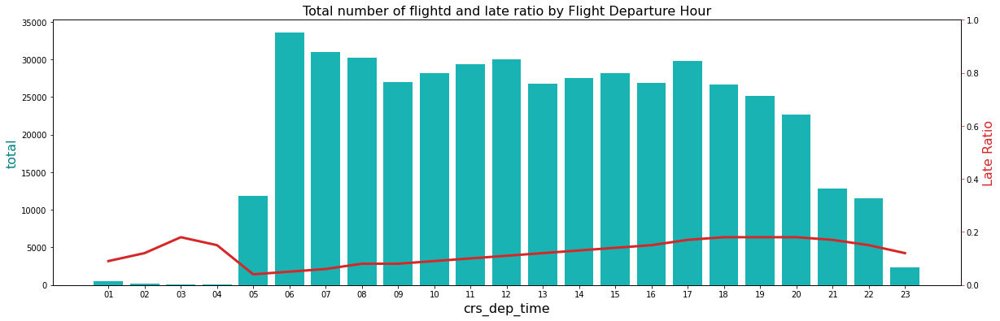

In [ ]:
#@title
quarterlate = df1[['crs_dep_time','is_late']].groupby('crs_dep_time').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'crs_dep_time',ascending = True)
quarterlate['ratio'] = round(quarterlate['num_late']/quarterlate['total'],2)


fig, ax1 = plt.subplots(figsize=(20,6))
color = '#008080'
ax1.set_title('Total number of flightd and late ratio by Flight Departure Hour', fontsize=16)
ax1.set_xlabel('Departure hour', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='crs_dep_time', y='total', data = quarterlate, color = '#00cdcd')
ax1.tick_params(axis='y') 
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='crs_dep_time', y='ratio', data = quarterlate, sort=False, color=color,linewidth = 3 )
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

<u>**For departure flights:**</u>

The more it gets to the end of the day, the higher late ratio we can see.

Peak hours are **from 16 to 21 o'clock**  with higher number of flights departed and also high late ratio.

From **midnight to 4AM**, although the number of flights are very low, the late ratio only gets higher.

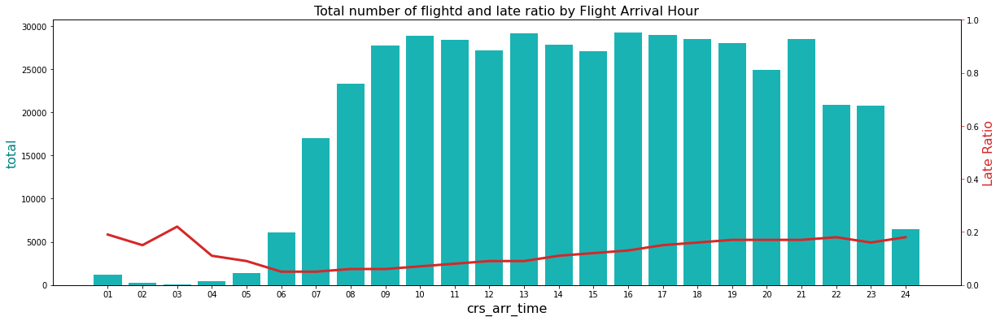

In [ ]:
#@title
quarterlate = df1[['crs_arr_time','is_late']].groupby('crs_arr_time').agg(['count','sum']).droplevel(axis=1, level=0).reset_index().rename(columns={"count": "total", "sum": "num_late"}).sort_values(by = 'crs_arr_time',ascending = True)
quarterlate['ratio'] = round(quarterlate['num_late']/quarterlate['total'],2)


fig, ax1 = plt.subplots(figsize=(20,6))
color = '#008080'
ax1.set_title('Total number of flightd and late ratio by Flight Arrival Hour', fontsize=16)
ax1.set_xlabel('Departure hour', fontsize=16)
ax1.set_ylabel('Avg Temp', fontsize=16, color=color)
ax2 = sns.barplot(x='crs_arr_time', y='total', data = quarterlate, color = '#00cdcd')
ax1.tick_params(axis='y') 
ax2 = ax1.twinx()
color = 'tab:red'
ax2.set_ylabel('Late Ratio', fontsize=16, color=color)
ax2 = sns.lineplot(x='crs_arr_time', y='ratio', data = quarterlate, sort=False, color=color,linewidth = 3 )
ax2.set(ylim=(0, 1))
ax2.tick_params(axis='y', color=color)
plt.show()

<u>**For departure flights:**</u>

The more it gets to the end of the day, the higher late ratio we can see.

Peak hours are **from 16 to 22 o'clock**  with higher number of flights departed and also high late ratio.

From **midnight to 3AM** (nearly 30% of flights arrived around 3AM were late, 30mins as they supposed to), although the number of flights are very low, the late ratio only gets higher.

### 6.4. Distance and CRS Elapsed Time

Text(0.5, 0, 'Late Arrival')

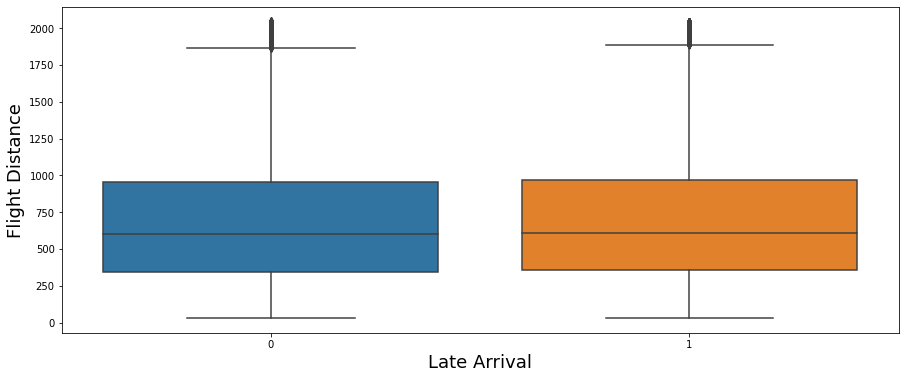

In [ ]:
plt.figure(figsize = (15,6))
sns.boxplot(data = df1, x = 'is_late',y = 'distance')
plt.ylabel("Flight Distance", fontsize=18)
plt.xlabel("Late Arrival", fontsize=18)

Text(0.5, 0, 'Late Arrival')

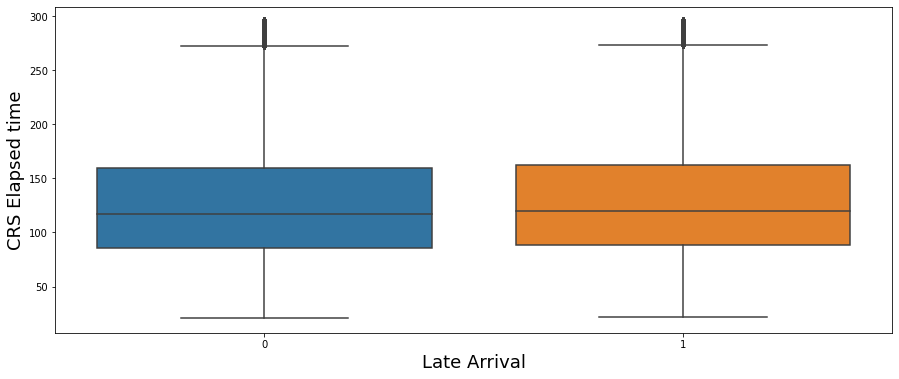

In [ ]:
plt.figure(figsize = (15,6))
sns.boxplot(data = df1, x = 'is_late',y = 'crs_elapsed_time')
plt.ylabel("CRS Elapsed time", fontsize=18)
plt.xlabel("Late Arrival", fontsize=18)

In [ ]:
df1[['distance','crs_elapsed_time']].corr()

,distance,crs_elapsed_time
distance,1.00,0.97
crs_elapsed_time,0.97,1.00


Findings:
- From 2 boxplots we can see for both distance and crs_elapsed_time, there's **almost no difference** regarding these 2 variables between late arrivals group and the other one. We will test again for these relationships in the Hypothesis testing section.

- For the Correlation between distance and crs_elapsed time, **0.97** means these two varibles are extremely dependent on each other and **one variable can almost perfectly explain the other one.**

# **7. Hypothesis testing**

### 7.1. Independent Numerical variables and **is_late** (categorical) target variable

Using **ANOVA** to test whether a dependent numeric variable varies significantly according to classes of our categorical variable.

In [ ]:
def calculateAnova(numVariable, catVariable=df1['is_late']):
    """Returns f statistics and p value after anova calculation."""
    
    groupNumVariableByCatVariable1 = numVariable[catVariable==1] # Group our numerical variable by categorical variable(1). Group of late arrivals
    groupNumVariableByCatVariable0 = numVariable[catVariable==0] # Group our numerical variable by categorical variable(0). Group of not late arrivals
    # Calculate one way anova
    fValue, pValue = stats.f_oneway(groupNumVariableByCatVariable1, groupNumVariableByCatVariable0) # Calculate f statistics and p value
    return f"Anova Result between {numVariable.name} & {catVariable.name}: f = {fValue}, p = {pValue}"

In [ ]:
calculateAnova(df1['distance'])

'Anova Result between distance & is_late: f = 18.43806904311575, p = 1.7555197399504664e-05'

With p < 0.05 and f statistics > 0, we can say late arrival flights tend to have longer distance than the ones that arrived on time.

In [ ]:
calculateAnova(df1['crs_elapsed_time'])

'Anova Result between crs_elapsed_time & is_late: f = 66.72103621245746, p = 3.1355574472625386e-16'

With p < 0.05 and f statistics > 0, we can say late arrival flights tend to have longer elapsed time than the ones that arrived on time.

We can see **crs_elapsed_time has p-value smaller than distance varible's in the test with 'is_late'**. So we can keep crs_elapsed_time instead of distance.

### 7.2. Independent Categorical variables and **is_late** (categorical) target variable

**Chi-square test**: to test if there's a significant relationship between two categorical variables.

In our case, we will test independent variables contains: **big_airline, busy_route, dep_airports_group and arr_airports_group** with target variable: is_late.

Hypotheses to be tested:

**H0:** There is **no significant relationship** between independent variable and our target variable.

**H1:** There is a **significant relationship** between independent variable and our target variable

In [ ]:
"""#Create a function to calculate chi square test between a categorical and target categorical variable."""
def calculateChiSquare(catVariable, targetCatVariable=df1.is_late):
    """Returns chi square test restult between independent and dependent target variables."""
    
    catGroupedByCatTarget = pd.crosstab(index = catVariable, columns = targetCatVariable)
    testResult = stats.chi2_contingency(catGroupedByCatTarget)
    print(f"Chi Square Test Result between {targetCatVariable.name} & {catVariable.name}:")
    return print(testResult)

In [ ]:
calculateChiSquare(df1['busy_route'])

Chi Square Test Result between is_late & busy_route:
(7.724582965902187, 0.005447394106209018, 1, array([[ 97184.21308795,  13065.78691205],
       [310317.78691205,  41720.21308795]]))


- First outcome, **7.724**, is the chi-square value.
- Second outcome, **0.0054**, is the p-value.
- Third outcome, which is **1**, is the degree of freedom (df)
- The array is for expected frequencies (count values) with number of rows = number of classes in our independent variable.

  we have **df = (r-1)(c-1)** 
  
  where r is the number of rows (number of classes in our feature) and c is the number of columns (number of classes in our target variable).

<b><u>Interpret the chi-square test results:</u> </b>

We have p-value < 0.05, and there is no expected frequency < 5, we can say there is **a statistically significant relationship between busy_route and is_late variables.**

In [ ]:
calculateChiSquare(df1['big_airline'])

Chi Square Test Result between is_late & big_airline:
(484.0223076776942, 2.8477773258895434e-107, 1, array([[109875.01685962,  14771.98314038],
       [297626.98314038,  40014.01685962]]))


<b><u>Interpret the chi-square test results:</u> </b>

We have p-value < 0.05, which in fact = 0, and there is no expected frequency < 5, we can say there is **a statistically significant relationship between big_airline and is_late variables.**

In [ ]:
calculateChiSquare(df1['dep_airport_group'])

Chi Square Test Result between is_late & dep_airport_group:
(289.9343646471579, 1.1004052654019898e-63, 2, array([[268521.08262382,  36100.91737618],
       [ 94299.09808172,  12677.90191828],
       [ 44681.81929447,   6007.18070553]]))


<b><u>Interpret the chi-square test results:</u> </b>

We have p-value < 0.05, which in fact = 0, and there is no expected frequency < 5, we can say there is **a statistically significant relationship between our newly created dep_airport_group and and is_late variables.**

In [ ]:
calculateChiSquare(df1['quarter'])

Chi Square Test Result between is_late & quarter:
(622.1416330757876, 1.596768581655445e-134, 3, array([[ 95339.25564583,  12817.74435417],
       [104312.81835998,  14024.18164002],
       [105479.9104065 ,  14181.0895935 ],
       [102370.01558769,  13762.98441231]]))


In [ ]:
calculateChiSquare(df1['month'])

Chi Square Test Result between is_late & month:
(1578.643884745153, 0.0, 11, array([[31929.31126051,  4292.68873949],
       [29389.74012304,  3951.25987696],
       [34020.20426228,  4573.79573772],
       [33947.92212647,  4564.07787353],
       [35046.25799502,  4711.74200498],
       [35318.6382385 ,  4748.3617615 ],
       [36249.49110944,  4873.50889056],
       [36282.98770896,  4878.01229104],
       [32947.4315881 ,  4429.5684119 ],
       [35315.99377012,  4748.00622988],
       [33340.57588776,  4482.42411224],
       [33713.44592981,  4532.55407019]]))


<b><u>Interpret the chi-square test results:</u> </b>

We have p-value < 0.05 of both quarter and month variables, which in fact = 0 for moth, and there is no expected frequency < 5, we can say there is **a statistically significant relationships between month, quarter and is_late**

In [ ]:
calculateChiSquare(df1['op_carrier'])

Chi Square Test Result between is_late & op_carrier:
(3081.014663630846, 0.0, 17, array([[14521.65738241,  1952.34261759],
       [49538.82622521,  6660.17377479],
       [10868.76505555,  1461.23494445],
       [15672.00112917,  2106.99887083],
       [52907.87894559,  7113.12105441],
       [12124.88753764,  1630.11246236],
       [ 6869.44737047,   923.55262953],
       [ 5880.4161951 ,   790.5838049 ],
       [ 4012.540027  ,   539.459973  ],
       [17510.78814505,  2354.21185495],
       [10074.54305109,  1354.45694891],
       [16348.9850353 ,  2198.0149647 ],
       [46522.36928927,  6254.63071073],
       [31801.49528865,  4275.50471135],
       [  624.97602793,    84.02397207],
       [80626.31505036, 10839.68494964],
       [12876.79804797,  1731.20195203],
       [18719.31019624,  2516.68980376]]))


No expected frequencies < 5, also p-value < 0 we can reject H0, and expect a statistically significant impact of op_carrier on is_late as expected.

# **8. Data Transformation**

In [ ]:
df1.columns

Index(['quarter', 'month', 'day_of_month', 'day_of_week', 'op_carrier',
       'tail_num', 'op_carrier_fl_num', 'origin', 'origin_state_abr', 'dest',
       'dest_state_abr', 'crs_dep_time', 'crs_arr_time', 'crs_elapsed_time',
       'distance', 'is_late', 'big_airline', 'dep_airport_group',
       'busy_route'],
      dtype='object')

As we saw in the previous sections, quarter and month, almost represent a smilar trend in number of flights arrived and late ratio, we can just keep month for further steps of classification.

As for CRS Elapsed time, it has 0.97 Pearson correlation score with Distance, so we can keep only Distance instead of both of them.

Also for airports and states variables, we already have airport_groups, distance and big_route to better represent those variables and make our dataset much more easier to comprehend.

In [ ]:
df1.drop(columns = ['quarter','distance','tail_num','op_carrier_fl_num','origin','dest','origin_state_abr','dest_state_abr'],inplace = True)

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 462288 entries, 695058 to 6911811
Data columns (total 11 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   month              462288 non-null  int64  
 1   day_of_month       462288 non-null  int64  
 2   day_of_week        462288 non-null  int64  
 3   op_carrier         462288 non-null  object 
 4   crs_dep_time       462288 non-null  object 
 5   crs_arr_time       462288 non-null  object 
 6   crs_elapsed_time   462288 non-null  float64
 7   is_late            462288 non-null  int64  
 8   big_airline        462288 non-null  int64  
 9   dep_airport_group  462288 non-null  int64  
 10  busy_route         462288 non-null  int64  
dtypes: float64(1), int64(7), object(3)
memory usage: 62.3+ MB


In [ ]:
# Correcting our variables' types before encoding
df1.loc[:, ["month","day_of_month","day_of_week","op_carrier", "big_airline","busy_route","dep_airport_group"]]\
= df1.loc[:, ["month","day_of_month","day_of_week","op_carrier", "big_airline","busy_route","dep_airport_group"]]\
.astype('category')

df1['crs_dep_time'] = df1['crs_dep_time'].astype(str).astype(int)
df1['crs_arr_time'] = df1['crs_arr_time'].astype(str).astype(int)

In [ ]:
display(df1.dtypes)

month                category
day_of_month         category
day_of_week          category
op_carrier           category
crs_dep_time            int64
crs_arr_time            int64
crs_elapsed_time      float64
is_late                 int64
big_airline          category
dep_airport_group    category
busy_route           category
dtype: object

In [ ]:
df1.head()

,month,day_of_month,day_of_week,op_carrier,crs_dep_time,crs_arr_time,crs_elapsed_time,is_late,big_airline,dep_airport_group,busy_route
695058,2,5,1,F9,7,10,138.00,0,0,2,0
713732,2,16,5,MQ,11,12,76.00,0,1,1,1
929508,2,4,7,AA,13,15,105.00,0,1,1,1
2867757,5,2,3,YX,15,17,79.00,0,1,1,0
4896810,9,14,5,DL,17,18,80.00,0,1,1,1


In [ ]:
#Create training set ans testing set.

X = pd.get_dummies(df1, drop_first= True).drop(columns = 'is_late').reset_index()
y = df1['is_late']
del X['index']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2, random_state = 1)

#Scale our dateset for each variable to have the range (0,1)
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

X_train = pd.DataFrame(X_train, columns = X.columns)
X_test = pd.DataFrame(X_test, columns = X.columns)

# summarize
print('Train', X_train.shape, y_train.shape)
print('Test', X_test.shape, y_test.shape)

Train (369830, 71) (369830,)
Test (92458, 71) (92458,)


# 9. Training models and Hold-out without dimensionality reducing

In this sections we will go through some of the basic classification algorithms, and keep default values of their parameters.

From that, we will how the models perform without tunning.

In [ ]:
#Prepare our models

"""#1.Logistic Regression"""
lr = LogisticRegression()

"""#2.Support Vector Machines"""
svc = SVC(kernel = 'rbf')

"""#3.Random Forest Classifier"""
rf = RandomForestClassifier()

"""#4.Gaussian Naive Bayes"""
gnb = GaussianNB()

"""#5.Decision Tree Classifier"""
dt = DecisionTreeClassifier()

"""#6.Gradient Boosting Classifier"""
gbc = GradientBoostingClassifier(random_state = 1)

"""#7.Adaboost Classifier"""
abc = AdaBoostClassifier(random_state = 1)

"""#8.LightGBM"""
lgbm = lgb.LGBMClassifier(random_state= 1)

"""#9.Extreme Gradient Boosting"""
xgbc = XGBClassifier(random_state = 1)

"""List of all the models with their indices."""
modelNames = ["LR", "RF", "GNB", "DT", "GBC", "ABC","LightGBM", "XGBC"]
models = [lr, rf, gnb, dt, gbc, abc, lgbm, xgbc]

In [ ]:
"""Create a function that returns train accuracy of different models."""
def calculateHoldout_AUC_Score(model):
    """Returns training accuracy of a model."""
    
    model.fit(X_train, y_train)
    Holdout_AUC_Score = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    Holdout_Gini_Score = Holdout_AUC_Score*2 - 1
    return Holdout_AUC_Score,Holdout_Gini_Score

# Calculate train accuracy of all the models and store them in a dataframe
modelScores = list(map(calculateHoldout_AUC_Score, models))
Holdout_AUC_Score = pd.DataFrame(modelScores, columns = ["Holdout_AUC_Score","Holdout_Gini_Score"], index=modelNames)
Holdout_AUC_Score_Sorted = Holdout_AUC_Score.sort_values(by="Holdout_AUC_Score", ascending=False)
# bold("Training Accuracy of the Classifiers:")
display(Holdout_AUC_Score_Sorted)

[00:16:59] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


,Holdout_AUC_Score,Holdout_Gini_Score
XGBC,0.71,0.42
LightGBM,0.70,0.40
GBC,0.67,0.34
RF,0.67,0.34
ABC,0.66,0.31
LR,0.65,0.31
GNB,0.62,0.24
DT,0.55,0.09


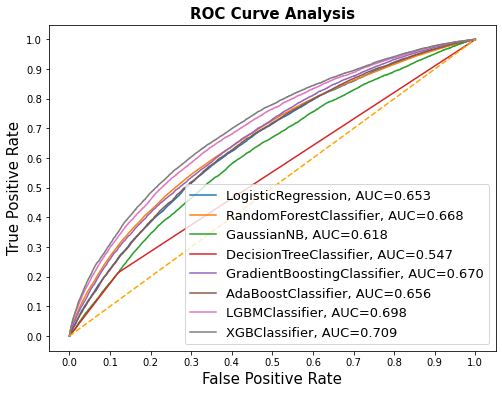

In [ ]:
#@title
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
#fpr: false positive rate
#tpr: true positive rate
#auc: area under the curve

for cls in models:
    # model = cls.fit(X_train, y_train)
    yproba = cls.predict_proba(X_test)[::,1]
    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
    
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

At first sight, LR and SVC were having very good accuracy scores, we will look abit deeper how they actually performed.

In [ ]:
#@title
"""Function for specificity score."""
def calculateSpecificityScore(model, y_test=y_test, xtest = X_test):
    """Returns a model's specificity score."""
    
    predicted = model.predict(xtest)
    tn, fp, fn, tp = confusion_matrix(y_test, predicted).ravel()
    recall_score_positives = tp / (tp + fn)
    precision_score_positives = tp / (tp + fp)
    return round(recall_score_positives, 5)

In [ ]:
#@title
def confusion_matrixxxxx(model, y_test=y_test, xtest=X_test):
  cf_matrix = confusion_matrix(y_test, model.predict(xtest))
  group_names = ['True Neg','False Pos','False Neg','True Pos']
  group_counts = ['{0:0.0f}'.format(value) for value in cf_matrix.flatten()]
  group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)
  sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Blues')

### 9.1. Logistic Regression model report

**Hold-out Gini score: 0.31**

In [ ]:
print(classification_report(y_test, lr.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



On the first look, LR model has a very good accuracy score regardless of 0.31 Gini score that we calculated.

But it turned to it predicted all of our test examples to be negative. Which gave us **0 False Positves and 0 True Positives.**

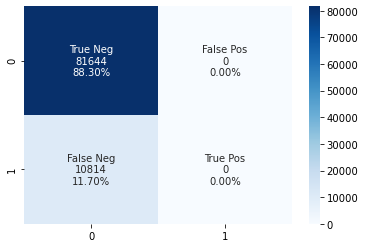

In [ ]:
confusion_matrixxxxx(lr,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lr, y_test = y_test, xtest=X_test)))

Recall on positive cases: 0.0


### 9.3. Random Forest model report

**Hold-out Gini score: 0.34**

In [ ]:
print(classification_report(y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     81644
           1       0.34      0.08      0.13     10814

    accuracy                           0.87     92458
   macro avg       0.62      0.53      0.53     92458
weighted avg       0.83      0.87      0.84     92458



Really high accuracy score with 0.87

Managed to **predict correctly 890 late arrivals out of 10800 actual late arrivals (8.23%)**.

**Precision score for positives cases: 0.34** ( = True Positives / (True Positives + False Positives): Or we can say for **every 3 positively assigned observations in the test set, averagely 1 of them is True positive.**

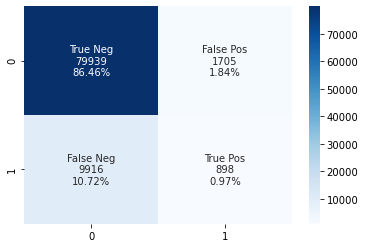

In [ ]:
confusion_matrixxxxx(rf,xtest = X_test)

Since Random Forest model assigned around 96% of its test set examples as negative, the model can be guaranted to have good accuracy score.

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=rf, y_test = y_test, xtest = X_test)))

Recall on positive cases: 0.08304


### 9.4. Decision Tree model report

**Hold-out Gini score: 0.09**

In [ ]:
print(classification_report(y_test, dt.predict(X_test)))

              precision    recall  f1-score   support

           0       0.89      0.88      0.89     81644
           1       0.19      0.21      0.20     10814

    accuracy                           0.80     92458
   macro avg       0.54      0.55      0.54     92458
weighted avg       0.81      0.80      0.81     92458



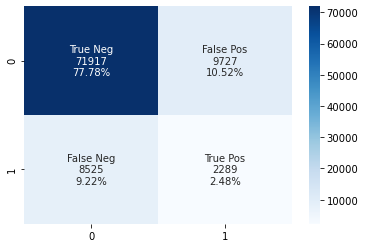

In [ ]:
confusion_matrixxxxx(dt,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=dt, y_test = y_test, xtest = X_test)))

Recall on positive cases: 0.21167


Decision Tree have the rank of 2 regarding the number of True Positive cases (Late arrivals) with **2282 flights detected.**

However, because the decision tree model made **so many False positives, with 9788 cases,** the final evaluation of the model become worse than expected.
This contributed to the bad AUC score of decision tree model.

### 9.5. Guassian Naive Bayes model report

**Hold-out Gini score: 0.24**

In [ ]:
print(classification_report(y_test, gnb.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.75      0.82     81644
           1       0.18      0.41      0.25     10814

    accuracy                           0.71     92458
   macro avg       0.54      0.58      0.53     92458
weighted avg       0.82      0.71      0.75     92458



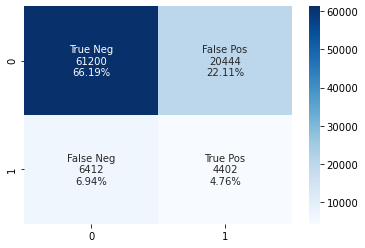

In [ ]:
confusion_matrixxxxx(gnb,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gnb, y_test = y_test, xtest = X_test)))

Recall on positive cases: 0.40706


Gaussian Naive Bayes correctly detected 4402, which is twice as many as what Random forest dectected.

However, the number of false positive cases doubled.

As a result, Random forest and Naive Bayes gave similar precision scores, 0.18 and 0.19 respectively.

### 9.6. Gradient Boosting Classifier report

In [ ]:
print(classification_report(y_test, gbc.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



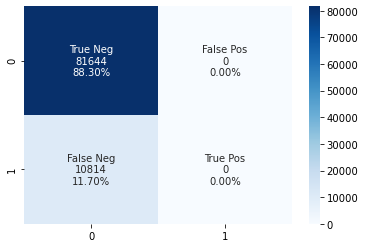

In [ ]:
confusion_matrixxxxx(gbc,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gbc, y_test = y_test,xtest = X_test)))

Recall on positive cases: 0.0


Our Gradient Boosting model doesn't seem to performed as well as it seemed.

Although it has 88% accuracy score, this score only came from the fact that GB model's all predictions were Negative (0), or NOTLATE.

This fact can be seen by **0 recall score of actual Positive samples**

### 9.7. Adaboost model report

In [ ]:
print(classification_report(y_test, abc.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



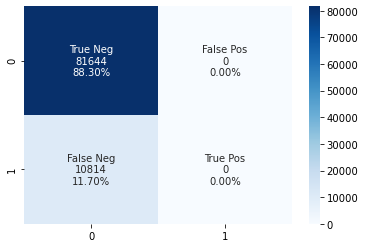

In [ ]:
confusion_matrixxxxx(abc,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=abc, y_test = y_test,xtest = X_test)))

Recall on positive cases: 0.0


Our Adaboost model doesn't seem to performed as well as it seemed.

Although it has 88% accuracy score, this score only came from the fact that Adaboost model's all predictions were Negative (0), or NOTLATE.

This fact can be seen by **0 recall score of actual Positive samples**

### 9.8. Light GBM model report

In [ ]:
print(classification_report(y_test, lgbm.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.67      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.77      0.50      0.47     92458
weighted avg       0.86      0.88      0.83     92458



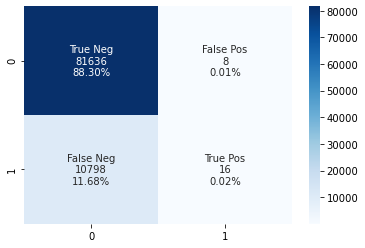

In [ ]:
confusion_matrixxxxx(lgbm,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lgbm, y_test = y_test,xtest = X_test)))

Recall on positive cases: 0.00148


Although the number of correctly detected late arrivals (True positives) Light GBM assigned was very small, accounted for 0.1% compared to 40% of GNB, **LightGBM had a significantly higher precision score with 67% correct prediction.**

### 9.9. Extreme Gradient Boosting model report

In [ ]:
print(classification_report(y_test, xgbc.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.56      0.01      0.02     10814

    accuracy                           0.88     92458
   macro avg       0.72      0.51      0.48     92458
weighted avg       0.85      0.88      0.83     92458



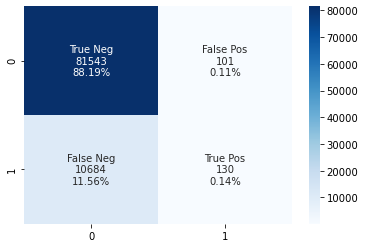

In [ ]:
confusion_matrixxxxx(xgbc,xtest = X_test)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=xgbc, y_test = y_test,xtest = X_test)))

Recall on positive cases: 0.01202


Despite the smaller precision score compared to LightGBM, 0.56 and 0.67, XGB model gave us around 10 times the number of True positive cases, **130 correctly detected late arrivals.**

# 10. Training models and Hold-out **with PCA**

Data (10 features) --> One-hot encoded (71 features) --> Scaled --> PCA

In [ ]:
pca = PCA(n_components= 0.95) #Select n number of components at which capture about 95% of the variability in the dataset

pca.fit(X_train)
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [ ]:
X_train_pca.shape

(369830, 56)

In [ ]:
X_test_pca.shape

(92458, 56)

PCA has chose only 56 components to represent our 71 original features, which contain 95% of variance.

In [ ]:
#@title
#Prepare our models

"""#1.Logistic Regression"""
lr = LogisticRegression()

"""#2.Support Vector Machines"""
svc = SVC(kernel = 'rbf')

"""#3.Random Forest Classifier"""
rf = RandomForestClassifier()

"""#4.Gaussian Naive Bayes"""
gnb = GaussianNB()

"""#5.Decision Tree Classifier"""
dt = DecisionTreeClassifier()

"""#6.Gradient Boosting Classifier"""
gbc = GradientBoostingClassifier(random_state = 1)

"""#7.Adaboost Classifier"""
abc = AdaBoostClassifier(random_state = 1)

"""#8.LightGBM"""
lgbm = lgb.LGBMClassifier(random_state= 1)

"""#9.Extreme Gradient Boosting"""
xgbc = XGBClassifier(random_state = 1)

"""List of all the models with their indices."""
modelNames = ["LR", "RF", "GNB", "DT", "GBC", "ABC","LightGBM", "XGBC"]
models = [lr, rf, gnb, dt, gbc, abc, lgbm, xgbc]

In [ ]:
#@title
"""Create a function that returns train accuracy of different models."""
def calculateHoldout_AUC_Score_pca(model):
    """Returns training accuracy of a model."""
    
    model.fit(X_train_pca, y_train)
    Holdout_AUC_Score = roc_auc_score(y_test, model.predict_proba(X_test_pca)[:, 1])
    Holdout_Gini_Score = Holdout_AUC_Score*2 - 1
    return Holdout_AUC_Score,Holdout_Gini_Score

# Calculate train accuracy of all the models and store them in a dataframe
modelScores = list(map(calculateHoldout_AUC_Score_pca, models))
Holdout_AUC_Score = pd.DataFrame(modelScores, columns = ["Holdout_AUC_Score","Holdout_Gini_Score"], index=modelNames)
Holdout_AUC_Score_Sorted = Holdout_AUC_Score.sort_values(by="Holdout_AUC_Score", ascending=False)
# bold("Training Accuracy of the Classifiers:")
display(Holdout_AUC_Score_Sorted)

[00:47:28] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


,Holdout_AUC_Score,Holdout_Gini_Score
XGBC,0.70,0.40
LightGBM,0.70,0.39
GBC,0.67,0.34
RF,0.66,0.32
ABC,0.65,0.30
LR,0.64,0.29
GNB,0.61,0.22
DT,0.55,0.10


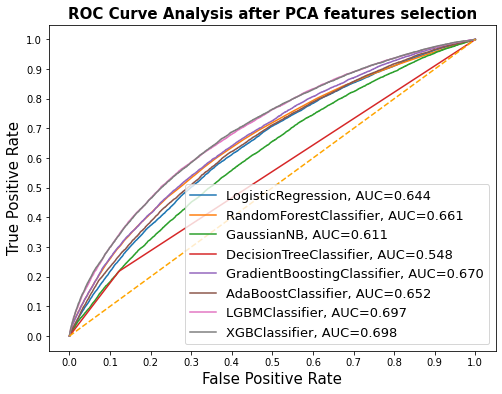

In [ ]:
#@title
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
#fpr: false positive rate
#tpr: true positive rate
#auc: area under the curve

for cls in models:
    # model = cls.fit(X_train, y_train)
    yproba = cls.predict_proba(X_test_pca)[::,1]
    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
    
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis after PCA features selection', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

### 10.1. Logistic Regression model report

In [ ]:
print(classification_report(y_test, lr.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



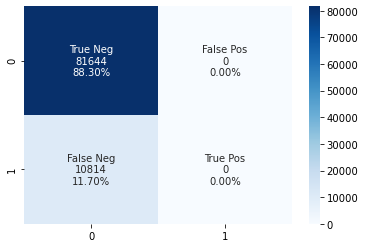

In [ ]:
confusion_matrixxxxx(lr,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lr, y_test = y_test, xtest=X_test_pca)))

Recall on positive cases: 0.0


Our logistics regression doesn't seem to performed as well as it seemed.

Although it has 88% accuracy score, this score only came from the fact that LR model's all predictions were Negative (0), or NOTLATE.

This fact can be seen by **0 recall score of actual Positive samples**

### 10.3. Random Forest model report

In [ ]:
print(classification_report(y_test, rf.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     81644
           1       0.33      0.09      0.14     10814

    accuracy                           0.87     92458
   macro avg       0.61      0.53      0.53     92458
weighted avg       0.82      0.87      0.84     92458



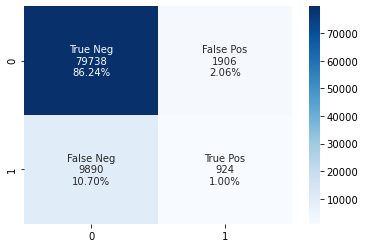

In [ ]:
confusion_matrixxxxx(rf,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=rf, y_test = y_test, xtest = X_test_pca)))

Recall on positive cases: 0.08544


### 10.4. Decision Tree model report

In [ ]:
print(classification_report(y_test, dt.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.89      0.88      0.89     81644
           1       0.19      0.21      0.20     10814

    accuracy                           0.80     92458
   macro avg       0.54      0.55      0.54     92458
weighted avg       0.81      0.80      0.81     92458



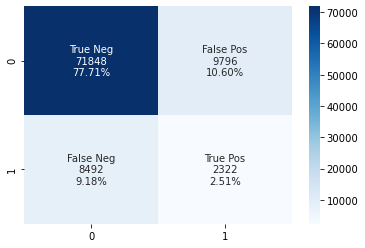

In [ ]:
confusion_matrixxxxx(dt,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=dt, y_test = y_test, xtest = X_test_pca)))

Recall on positive cases: 0.21472


### 10.5. Guassian Naive Bayes model report

In [ ]:
print(classification_report(y_test, gnb.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.89      0.94      0.91     81644
           1       0.20      0.12      0.15     10814

    accuracy                           0.84     92458
   macro avg       0.55      0.53      0.53     92458
weighted avg       0.81      0.84      0.82     92458



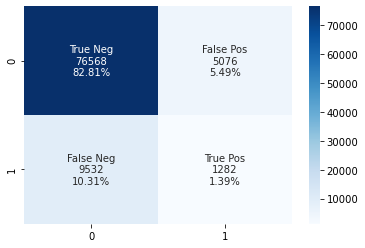

In [ ]:
confusion_matrixxxxx(gnb,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gnb, y_test = y_test, xtest = X_test_pca)))

Recall on positive cases: 0.11855


### 10.6. Gradient Boosting Classifier report

In [ ]:
print(classification_report(y_test, gbc.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.50      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.69      0.50      0.47     92458
weighted avg       0.84      0.88      0.83     92458



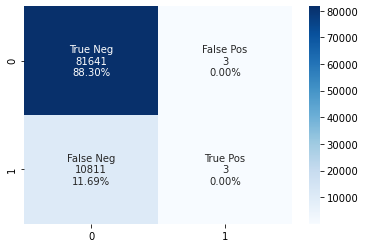

In [ ]:
confusion_matrixxxxx(gbc,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gbc, y_test = y_test,xtest = X_test_pca)))

Recall on positive cases: 0.00028


### 10.7. Adaboost model report**

In [ ]:
print(classification_report(y_test, abc.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       1.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.94      0.50      0.47     92458
weighted avg       0.90      0.88      0.83     92458



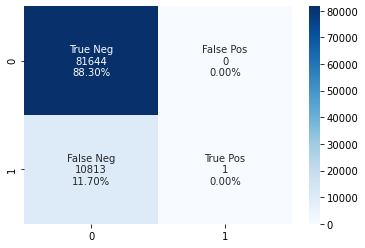

In [ ]:
confusion_matrixxxxx(abc,xtest = X_test_pca)

Adaboost with PCA gave precision score of 100%. 

The reason was that it was just confident enough to predict just one single case of late arrival, that case turned our to be true and gave our adaboost model 100% precision score.

**This is one of the classic example why we should observe both recall score and precision score.**

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=abc, y_test = y_test,xtest = X_test_pca)))

Recall on positive cases: 9e-05


Our logistics regression doesn't seem to performed as well as it seemed.

Although it has 88% accuracy score, this score only came from the fact that LR model's all predictions were Negative (0), or NOTLATE.

This fact can be seen by **0 recall score of actual Positive samples**

### 10.8. Light GBM model report

In [ ]:
print(classification_report(y_test, lgbm.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.59      0.00      0.01     10814

    accuracy                           0.88     92458
   macro avg       0.74      0.50      0.47     92458
weighted avg       0.85      0.88      0.83     92458



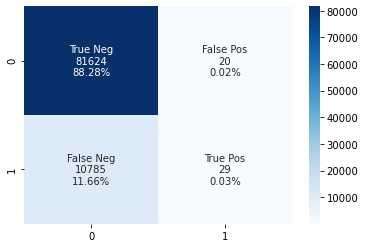

In [ ]:
confusion_matrixxxxx(lgbm,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lgbm, y_test = y_test,xtest = X_test_pca)))

Recall on positive cases: 0.00268


### 10.9. Extreme Gradient Boosting model report

In [ ]:
print(classification_report(y_test, xgbc.predict(X_test_pca)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.57      0.02      0.03     10814

    accuracy                           0.88     92458
   macro avg       0.73      0.51      0.48     92458
weighted avg       0.85      0.88      0.83     92458



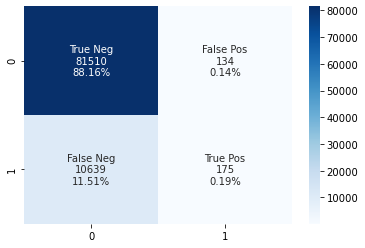

In [ ]:
confusion_matrixxxxx(xgbc,xtest = X_test_pca)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=xgbc, y_test = y_test,xtest = X_test_pca)))

Recall on positive cases: 0.01618


Our logistics regression doesn't seem to performed as well as it seemed.

Although it has 88% accuracy score, this score only came from the fact that LR model's all predictions were Negative (0), or NOTLATE.

This fact can be seen by **0 recall score of actual Positive samples**

# 11. Training models and Hold-out **with SelectKBest**

Data (10 features) --> One-hot encoded (71 features) --> Scaled --> SelectKBest

In [ ]:
# Select indicator/metrics to rank and choose features
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# feature selection: using chisquared indicator
def select_features(X_train, y_train, X_test):
    fs = SelectKBest(score_func=chi2, k=56) # we will also n=56 to see if selectKBest have better set of the best 56 features than pca
    fs.fit(X_train, y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

X_train_kbest, X_test_kbest, fs = select_features(X_train, y_train, X_test)

In [ ]:
X_train_kbest.shape

(369830, 56)

In [ ]:
#@title
#Prepare our models

"""#1.Logistic Regression"""
lr = LogisticRegression()

"""#2.Support Vector Machines"""
svc = SVC(kernel = 'rbf')

"""#3.Random Forest Classifier"""
rf = RandomForestClassifier()

"""#4.Gaussian Naive Bayes"""
gnb = GaussianNB()

"""#5.Decision Tree Classifier"""
dt = DecisionTreeClassifier()

"""#6.Gradient Boosting Classifier"""
gbc = GradientBoostingClassifier(random_state = 1)

"""#7.Adaboost Classifier"""
abc = AdaBoostClassifier(random_state = 1)

"""#8.LightGBM"""
lgbm = lgb.LGBMClassifier(random_state= 1)

"""#9.Extreme Gradient Boosting"""
xgbc = XGBClassifier(random_state = 1)

"""List of all the models with their indices."""
modelNames = ["LR", "RF", "GNB", "DT", "GBC", "ABC","LightGBM", "XGBC"]
models = [lr, rf, gnb, dt, gbc, abc, lgbm, xgbc]

In [ ]:
#@title
"""Create a function that returns train accuracy of different models."""
def calculateHoldout_AUC_Score_kbest(model):
    """Returns training accuracy of a model."""
    
    model.fit(X_train_kbest, y_train)
    Holdout_AUC_Score = roc_auc_score(y_test, model.predict_proba(X_test_kbest)[:, 1])
    Holdout_Gini_Score = Holdout_AUC_Score*2 - 1
    return Holdout_AUC_Score,Holdout_Gini_Score

# Calculate train accuracy of all the models and store them in a dataframe
modelScores = list(map(calculateHoldout_AUC_Score_kbest, models))
Holdout_AUC_Score = pd.DataFrame(modelScores, columns = ["Holdout_AUC_Score","Holdout_Gini_Score"], index=modelNames)
Holdout_AUC_Score_Sorted = Holdout_AUC_Score.sort_values(by="Holdout_AUC_Score", ascending=False)
# bold("Training Accuracy of the Classifiers:")
display(Holdout_AUC_Score_Sorted)

[00:51:07] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


,Holdout_AUC_Score,Holdout_Gini_Score
XGBC,0.70,0.40
LightGBM,0.69,0.38
GBC,0.67,0.34
ABC,0.66,0.31
LR,0.65,0.30
RF,0.65,0.30
GNB,0.62,0.24
DT,0.54,0.08


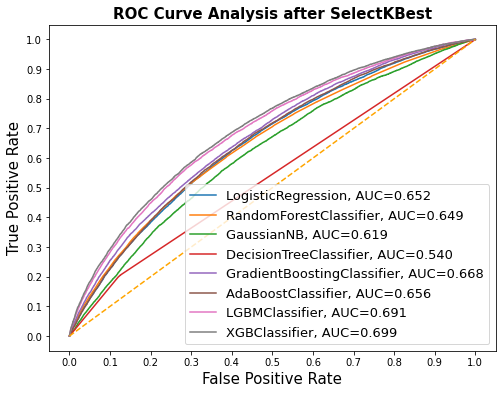

In [ ]:
#@title
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
#fpr: false positive rate
#tpr: true positive rate
#auc: area under the curve

for cls in models:
    # model = cls.fit(X_train, y_train)
    yproba = cls.predict_proba(X_test_kbest)[::,1]
    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
    
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis after SelectKBest', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

### 11.1. Logistic Regression model report

In [ ]:
print(classification_report(y_test, lr.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



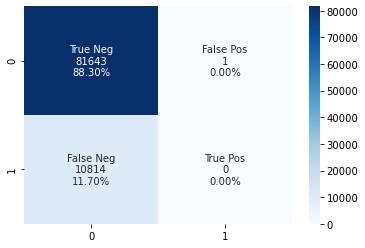

In [ ]:
confusion_matrixxxxx(lr,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lr, y_test = y_test, xtest=X_test_kbest)))

Recall on positive cases: 0.0


### 11.3. Random Forest model report

In [ ]:
print(classification_report(y_test, rf.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.89      0.97      0.93     81644
           1       0.29      0.08      0.13     10814

    accuracy                           0.87     92458
   macro avg       0.59      0.53      0.53     92458
weighted avg       0.82      0.87      0.84     92458



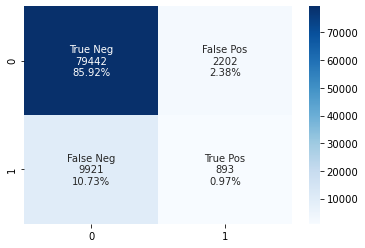

In [ ]:
confusion_matrixxxxx(rf,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=rf, y_test = y_test, xtest = X_test_kbest)))

Recall on positive cases: 0.08258


### 11.4. Decision Tree model report

In [ ]:
print(classification_report(y_test, dt.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.89      0.88      0.89     81644
           1       0.18      0.20      0.19     10814

    accuracy                           0.80     92458
   macro avg       0.54      0.54      0.54     92458
weighted avg       0.81      0.80      0.80     92458



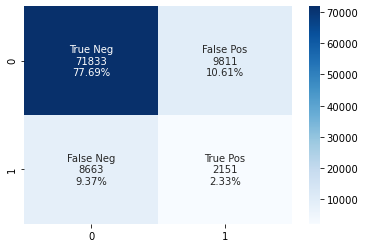

In [ ]:
confusion_matrixxxxx(dt,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=dt, y_test = y_test, xtest = X_test_kbest)))

Recall on positive cases: 0.19891


Our logistics regression doesn't seem to performed as well as it seemed.

Although it has 88% accuracy score, this score only came from the fact that LR model's all predictions were Negative (0), or NOTLATE.

This fact can be seen by **0 recall score of actual Positive samples**

### 11.5. Guassian Naive Bayes model report

In [ ]:
print(classification_report(y_test, gnb.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.90      0.75      0.82     81644
           1       0.18      0.40      0.25     10814

    accuracy                           0.71     92458
   macro avg       0.54      0.58      0.53     92458
weighted avg       0.82      0.71      0.75     92458



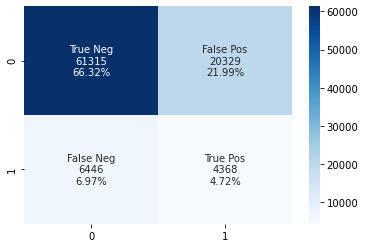

In [ ]:
confusion_matrixxxxx(gnb,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gnb, y_test = y_test, xtest = X_test_kbest)))

Recall on positive cases: 0.40392


### 11.6. Gradient Boosting Classifier report

In [ ]:
print(classification_report(y_test, gbc.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



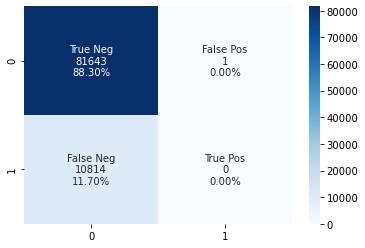

In [ ]:
confusion_matrixxxxx(gbc,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gbc, y_test = y_test,xtest = X_test_kbest)))

Recall on positive cases: 0.0


### 11.7. Adaboost model report

In [ ]:
print(classification_report(y_test, abc.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



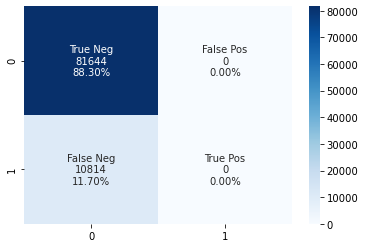

In [ ]:
confusion_matrixxxxx(abc,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=abc, y_test = y_test,xtest = X_test_kbest)))

Recall on positive cases: 0.0


### 11.8. Light GBM model report**

In [ ]:
print(classification_report(y_test, lgbm.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       1.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.94      0.50      0.47     92458
weighted avg       0.90      0.88      0.83     92458



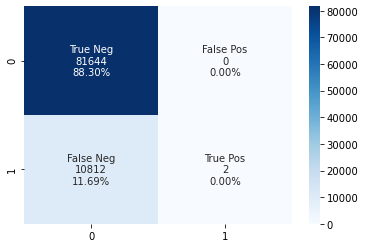

In [ ]:
confusion_matrixxxxx(lgbm,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lgbm, y_test = y_test,xtest = X_test_kbest)))

Recall on positive cases: 0.00018


LightGBM model with PCA gave precision score of 100%. 

The reason was that it was just confident enough to predict just two cases of late arrival, those cases turned our to be true and gave our LightGBM model 100% precision score.

**This is one of the classic example why we should observe both recall score and precision score.**

### 11.9. Extreme Gradient Boosting model report

In [ ]:
print(classification_report(y_test, xgbc.predict(X_test_kbest)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.54      0.01      0.02     10814

    accuracy                           0.88     92458
   macro avg       0.71      0.50      0.48     92458
weighted avg       0.84      0.88      0.83     92458



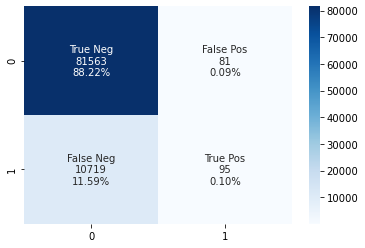

In [ ]:
confusion_matrixxxxx(xgbc,xtest = X_test_kbest)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=xgbc, y_test = y_test,xtest = X_test_kbest)))

Recall on positive cases: 0.00878


# 12. Training models and Hold-out validation **with RFE**

In [ ]:
#For RFE, we can try n_feature = 56 to compare the overall performance with PCA.
lbbm1 = lgb.LGBMClassifier(random_state= 1)
rfe = RFE( estimator = lbbm1,  n_features_to_select= 56)
X_train_rfe = rfe.fit_transform(X_train, y_train)
X_test_rfe = rfe.transform(X_test)

In [ ]:
X_train_rfe.shape

(369830, 56)

In [ ]:
#@title
#Prepare our models

"""#1.Logistic Regression"""
lr = LogisticRegression()

"""#2.Support Vector Machines"""
svc = SVC(kernel = 'rbf')

"""#3.Random Forest Classifier"""
rf = RandomForestClassifier()

"""#4.Gaussian Naive Bayes"""
gnb = GaussianNB()

"""#5.Decision Tree Classifier"""
dt = DecisionTreeClassifier()

"""#6.Gradient Boosting Classifier"""
gbc = GradientBoostingClassifier(random_state = 1)

"""#7.Adaboost Classifier"""
abc = AdaBoostClassifier(random_state = 1)

"""#8.LightGBM"""
lgbm = lgb.LGBMClassifier(random_state= 1)

"""#9.Extreme Gradient Boosting"""
xgbc = XGBClassifier(random_state = 1)

"""List of all the models with their indices."""
modelNames = ["LR", "RF", "GNB", "DT", "GBC", "ABC","LightGBM", "XGBC"]
models = [lr, rf, gnb, dt, gbc, abc, lgbm, xgbc]

In [ ]:
#@title
"""Create a function that returns train accuracy of different models."""
def calculateHoldout_AUC_Score_rfe(model):
    """Returns training accuracy of a model."""
    
    model.fit(X_train_rfe, y_train)
    Holdout_AUC_Score = roc_auc_score(y_test, model.predict_proba(X_test_rfe)[:, 1])
    Holdout_Gini_Score = Holdout_AUC_Score*2 - 1
    return Holdout_AUC_Score,Holdout_Gini_Score

# Calculate train accuracy of all the models and store them in a dataframe
modelScores = list(map(calculateHoldout_AUC_Score_rfe, models))
Holdout_AUC_Score = pd.DataFrame(modelScores, columns = ["Holdout_AUC_Score","Holdout_Gini_Score"], index=modelNames)
Holdout_AUC_Score_Sorted = Holdout_AUC_Score.sort_values(by="Holdout_AUC_Score", ascending=False)
# bold("Training Accuracy of the Classifiers:")
display(Holdout_AUC_Score_Sorted)

[00:54:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


,Holdout_AUC_Score,Holdout_Gini_Score
XGBC,0.70,0.40
LightGBM,0.69,0.39
GBC,0.67,0.34
ABC,0.66,0.31
RF,0.65,0.31
LR,0.65,0.31
GNB,0.62,0.24
DT,0.54,0.09


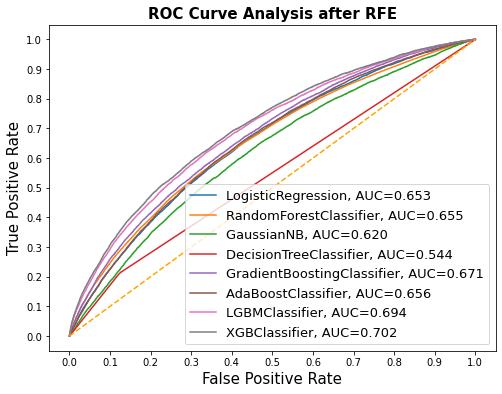

In [ ]:
#@title
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
#fpr: false positive rate
#tpr: true positive rate
#auc: area under the curve

for cls in models:
    # model = cls.fit(X_train, y_train)
    yproba = cls.predict_proba(X_test_rfe)[::,1]
    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
    
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis after RFE', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

### 12.1. Logistic Regression model report

In [ ]:
print(classification_report(y_test, lr.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



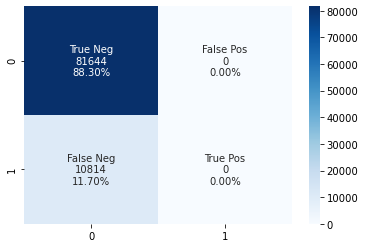

In [ ]:
confusion_matrixxxxx(lr,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lr, y_test = y_test, xtest=X_test_rfe)))

Recall on positive cases: 0.0


### 12.3. Random Forest model report

In [ ]:
print(classification_report(y_test, rf.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.89      0.98      0.93     81644
           1       0.32      0.08      0.13     10814

    accuracy                           0.87     92458
   macro avg       0.60      0.53      0.53     92458
weighted avg       0.82      0.87      0.84     92458



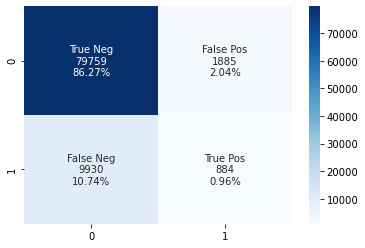

In [ ]:
confusion_matrixxxxx(rf,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=rf, y_test = y_test, xtest = X_test_rfe)))

Recall on positive cases: 0.08175


### 12.4. Decision Tree model report

In [ ]:
print(classification_report(y_test, dt.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.89      0.88      0.89     81644
           1       0.19      0.21      0.20     10814

    accuracy                           0.80     92458
   macro avg       0.54      0.54      0.54     92458
weighted avg       0.81      0.80      0.81     92458



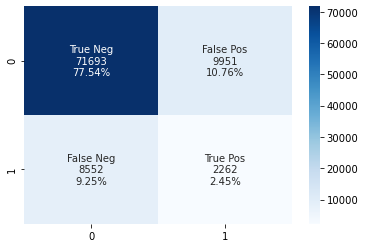

In [ ]:
confusion_matrixxxxx(dt,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=dt, y_test = y_test, xtest = X_test_rfe)))

Recall on positive cases: 0.20917


### 12.5. Guassian Naive Bayes model report

In [ ]:
print(classification_report(y_test, gnb.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.90      0.76      0.83     81644
           1       0.18      0.40      0.25     10814

    accuracy                           0.72     92458
   macro avg       0.54      0.58      0.54     92458
weighted avg       0.82      0.72      0.76     92458



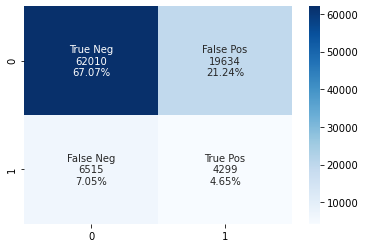

In [ ]:
confusion_matrixxxxx(gnb,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gnb, y_test = y_test, xtest = X_test_rfe)))

Recall on positive cases: 0.39754


### 12.6. Gradient Boosting Classifier report

In [ ]:
print(classification_report(y_test, gbc.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



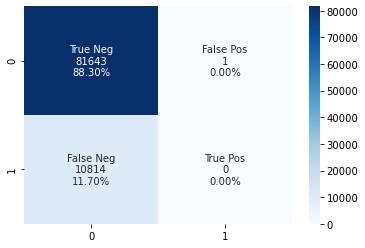

In [ ]:
confusion_matrixxxxx(gbc,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=gbc, y_test = y_test,xtest = X_test_rfe)))

Recall on positive cases: 0.0


### 12.7. Adaboost model report

In [ ]:
print(classification_report(y_test, abc.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.00      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.44      0.50      0.47     92458
weighted avg       0.78      0.88      0.83     92458



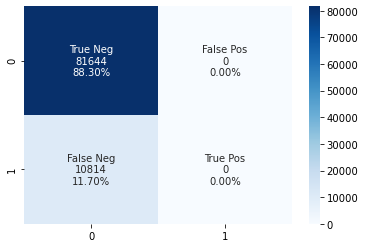

In [ ]:
confusion_matrixxxxx(abc,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=abc, y_test = y_test,xtest = X_test_rfe)))

Recall on positive cases: 0.0


### 12.8. Light GBM model report

In [ ]:
print(classification_report(y_test, lgbm.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.71      0.00      0.00     10814

    accuracy                           0.88     92458
   macro avg       0.79      0.50      0.47     92458
weighted avg       0.86      0.88      0.83     92458



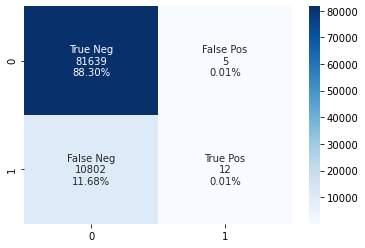

In [ ]:
confusion_matrixxxxx(lgbm,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=lgbm, y_test = y_test,xtest = X_test_rfe)))

Recall on positive cases: 0.00111


### 12.9. Extreme Gradient Boosting model report

In [ ]:
print(classification_report(y_test, xgbc.predict(X_test_rfe)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.60      0.01      0.03     10814

    accuracy                           0.88     92458
   macro avg       0.74      0.51      0.48     92458
weighted avg       0.85      0.88      0.83     92458



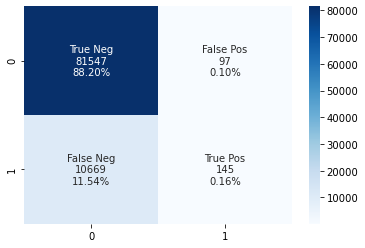

In [ ]:
confusion_matrixxxxx(xgbc,xtest = X_test_rfe)

In [ ]:
print("Recall on positive cases: {}".format(calculateSpecificityScore(model=xgbc, y_test = y_test,xtest = X_test_rfe)))

Recall on positive cases: 0.01341


# 13. Overall conclusion for all of our models and tests so far.

In [ ]:
#@title
data_gini = {
  'original(71)':[0.31,0.34,0.24,0.09,0.34,0.31, 0.4, 0.42],
'pca(56)': [0.29,0.32,0.22,0.1,0.34,0.3, 0.39, 0.4],
'sKbest(56)':[0.3,0.3,0.24,0.08,0.34,0.31, 0.38, 0.4],
'rfe(56)':[0.31,0.31,0.24,0.08,0.34,0.31, 0.39, 0.4],
  }
models_name_index = ["Logistic Regression", "Random Forest", "Gaussian Naive Bayes", "Decision Tree", "Gradient Boosting", "AdaBoost","LightGBM", "XGB (Extreme Gradient Boosting)"]


data_recall = {
  'original(71)':[0,0.08,0.21,0.41,0,0, 0.0014, 0.012],
'pca(56)': [0,0.0873,0.215,0.119,0.0002,0, 0.0026, 0.016],
'sKbest(56)':[0,0.083,0.202,0.404,0,0, 0.0019, 0.0088],
'rfe(56)':[0,0.0837,0.206,0.398,0,0, 0.0011, 0.013]
}


data_precision = {
  'original(71)':[0,0.34,0.19,0.18,0,0, 0.67, 0.56],
'pca(56)': [0,0.34,0.19,0.2,0.5,1, 0.59, 0.57],
'sKbest(56)':[0,0.29,0.18,0.18,0,0, 1, 0.54],
'rfe(56)':[0,0.32,0.18,0.18,0,0, 0.71, 0.6]
}

df_gini = pd.DataFrame.from_dict(data_gini)
df_recall = pd.DataFrame.from_dict(data_recall)
df_precision = pd.DataFrame.from_dict(data_precision)
df_gini.set_index([models_name_index],inplace= True)
df_recall.set_index([models_name_index],inplace= True)
df_precision.set_index([models_name_index],inplace= True)



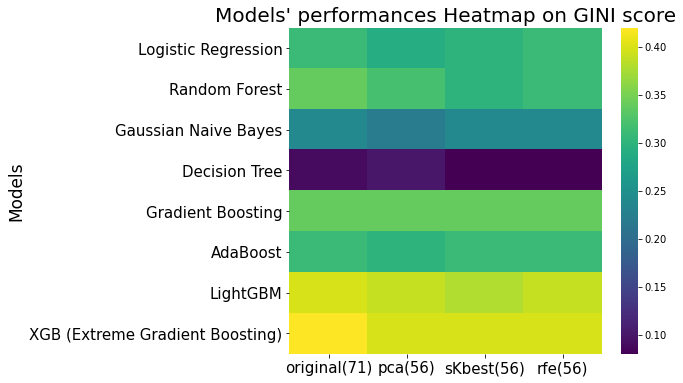

In [ ]:
plt.figure(figsize = (7,6))
b = sns.heatmap(data = df_gini,cmap = 'viridis')
b.axes.set_title("Models' performances Heatmap on GINI score",fontsize=20)
b.set_ylabel("Models",fontsize=17)
b.tick_params(labelsize=15)

For Gini score, XGBC and LightGBM had the best scores amongst the models.

Original dataset with 71 features (after one-hot encoding) has a very slightly better performances on some models compared to when we use dimension reducing methods.

Decision Tree made so many False Positive assignments which brings very bad score of Gini.

In [ ]:
df_recall

,original(71),pca(56),sKbest(56),rfe(56)
Logistic Regression,0.00,0.00,0.00,0.00
Random Forest,0.08,0.09,0.08,0.08
Gaussian Naive Bayes,0.21,0.21,0.20,0.21
Decision Tree,0.41,0.12,0.40,0.40
Gradient Boosting,0.00,0.00,0.00,0.00
AdaBoost,0.00,0.00,0.00,0.00
LightGBM,0.00,0.00,0.00,0.00
XGB (Extreme Gradient Boosting),0.01,0.02,0.01,0.01


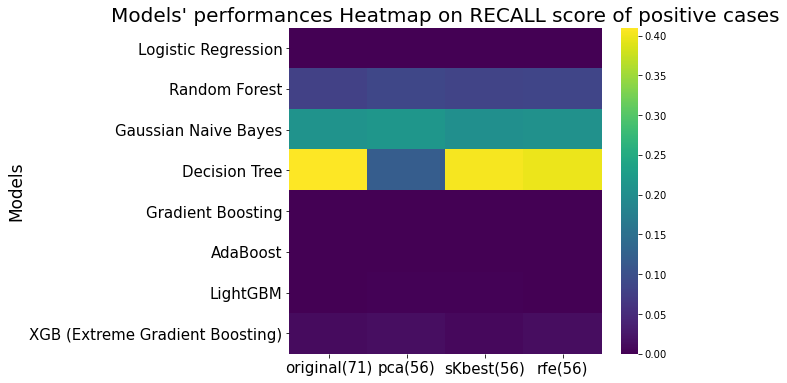

In [ ]:
plt.figure(figsize = (7,6))
b = sns.heatmap(data = df_recall,cmap = 'viridis')
b.axes.set_title("Models' performances Heatmap on RECALL score of positive cases",fontsize=20)
b.set_ylabel("Models",fontsize=17)
b.tick_params(labelsize=15)

For **Recall score on Positives** (Of all the late arrivals, what fraction of them did the model correctly dectec as late?):

Decision Tree model gave the best score, followed by Gaussian Naive Bayes and Random Forest.

The common thing among these tree were that, they performed so bad on Gini score. Which means these model might set the "thresh hold", or condition for a arrival to be late, lower than the other models. 

We can check for this assumption by precision score.

In [ ]:
df_precision

,original(71),pca(56),sKbest(56),rfe(56)
Logistic Regression,0.00,0.00,0.00,0.00
Random Forest,0.34,0.34,0.29,0.32
Gaussian Naive Bayes,0.19,0.19,0.18,0.18
Decision Tree,0.18,0.20,0.18,0.18
Gradient Boosting,0.00,0.50,0.00,0.00
AdaBoost,0.00,1.00,0.00,0.00
LightGBM,0.67,0.59,1.00,0.71
XGB (Extreme Gradient Boosting),0.56,0.57,0.54,0.60


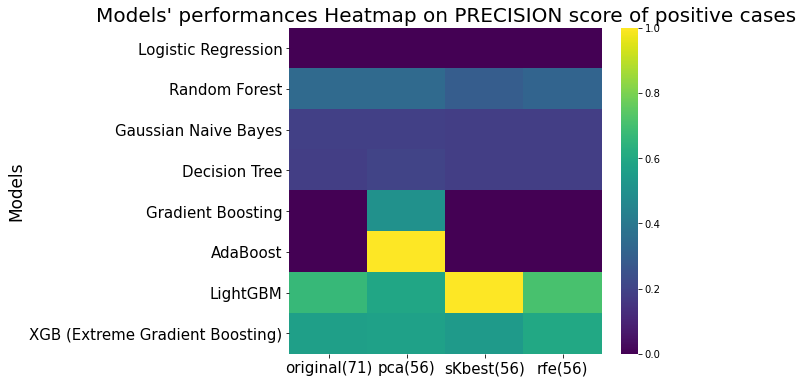

In [ ]:
plt.figure(figsize = (7,6))
b = sns.heatmap(data = df_precision,cmap = 'viridis')
b.axes.set_title("Models' performances Heatmap on PRECISION score of positive cases",fontsize=20)
b.set_ylabel("Models",fontsize=17)
b.tick_params(labelsize=15)

If we exclude those models that never predicted any positive cases, or 1 as most, (LR, Gradient Boosting and Adaboost):

- As we expected for the high Recall scores and relatively low Gini scores, Guassian Naiye Bayes and Decision had the worst precision scores aroud 0.2.

- LightGBM and XGBC both had better precision score than GNB and DT, which means they set a higher threshold than these classifiers.

- LightGBM always gave very slightly better precision scores compared to XGB's.

- XGB model alwasy gave significantly higher recall scores compared to LightGBM's.

AdaBoost, Gradient Boosting and Logistics Regression are most likely to assign all examples in test set to dominant class in our target varible.

# 14. Tuning model

In [ ]:
xgbc = XGBClassifier(random_state = 1,tree_method = 'gpu_hist')
        

In [ ]:
xgbc_params = {
        'learning_rate': [0.04,0.06,0.08, 0.1],
        'max_depth': [6,8,10,12],
        'min_child_weight': [5,10,20,50,100,200],
        'subsample': [0.5, 0.8, 1],
        'colsample_bytree': [0.5, 0.8,1]
    }

In [ ]:
gridSearch = GridSearchCV(xgbc, xgbc_params, cv=5,  scoring= 'roc_auc', n_jobs= -1)

gridSearch.fit(X_train,y_train)
bestParams, bestScore = gridSearch.best_params_, round(gridSearch.best_score_*100, 2)
print( bestScore, bestParams)

[04:07:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
71.11 {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 12, 'min_child_weight': 5, 'subsample': 0.8}


In [ ]:
optimised_xgbc = gridSearch.best_estimator_

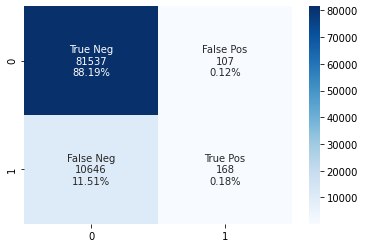

In [ ]:
confusion_matrixxxxx(optimised_xgbc,xtest = X_test)

In [ ]:
print(classification_report(y_test, optimised_xgbc.predict(X_test)))

              precision    recall  f1-score   support

           0       0.88      1.00      0.94     81644
           1       0.61      0.02      0.03     10814

    accuracy                           0.88     92458
   macro avg       0.75      0.51      0.48     92458
weighted avg       0.85      0.88      0.83     92458



**Precision** score for positive cases increased from **0.57 to 0.61**, whereas

**Recall** score for positive cases increased from **0.01 to 0.02**.

From these metrics, we can say, after tuning, our xgb model not only increases its number of late arrivals detected but also, the likelihood of correct prediction.

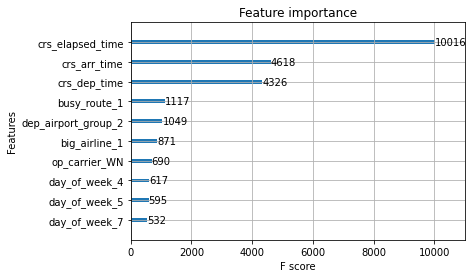

In [ ]:
from xgboost import plot_importance
plot_importance(optimised_xgbc, max_num_features=10) # top 10 most important features
plt.show()

The number of flight time had the highest impact on our model, followed by Departure and Arrival hours.

Our newly created varibles, such as busy_route, dep_airport_group and big_airlines also contributed alot.


In [ ]:
explainer = shap.TreeExplainer(optimised_xgbc)
shap_values = explainer.shap_values(X_train)
shap.summary_plot(shap_values, X_test, plot_type="bar")
# shap.summary_plot(shap_values, X_test)

In [ ]:
models = [optimised_xgbc]
modelNames = ["Tuned_XGBC"]

In [ ]:
#@title
"""Create a function that returns train accuracy of different models."""
def calculateHoldout_AUC_Score(model):
    """Returns training accuracy of a model."""
    
    # model.fit(X_train, y_train)
    Holdout_AUC_Score = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    Holdout_Gini_Score = Holdout_AUC_Score*2 - 1
    return Holdout_AUC_Score,Holdout_Gini_Score

# Calculate train accuracy of all the models and store them in a dataframe
modelScores = list(map(calculateHoldout_AUC_Score, models))
Holdout_AUC_Score = pd.DataFrame(modelScores, columns = ["Holdout_AUC_Score","Holdout_Gini_Score"], index=modelNames)
Holdout_AUC_Score_Sorted = Holdout_AUC_Score.sort_values(by="Holdout_AUC_Score", ascending=False)
# bold("Training Accuracy of the Classifiers:")
display(Holdout_AUC_Score_Sorted)

,Holdout_AUC_Score,Holdout_Gini_Score
Tuned_XGBC,0.71,0.42


After tuning, XGBC gave us a slightly better Gini score, from 0.4 to 0.42.

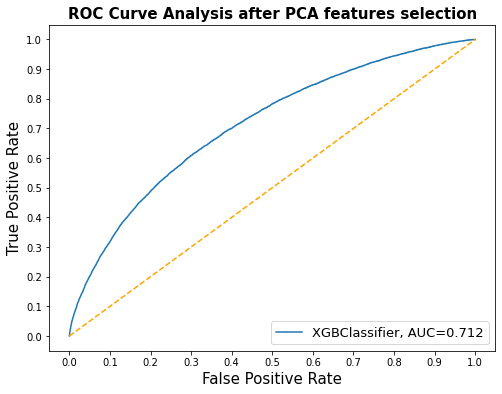

In [ ]:
#@title
result_table = pd.DataFrame(columns=['classifiers', 'fpr','tpr','auc'])
#fpr: false positive rate
#tpr: true positive rate
#auc: area under the curve

for cls in models:
    # model = cls.fit(X_train, y_train)
    yproba = cls.predict_proba(X_test)[::,1]
    
    fpr, tpr, _ = roc_curve(y_test,  yproba)
    auc = roc_auc_score(y_test, yproba)
    
    result_table = result_table.append({'classifiers':cls.__class__.__name__,
                                        'fpr':fpr, 
                                        'tpr':tpr, 
                                        'auc':auc}, ignore_index=True)
    
# Set name of the classifiers as index labels
result_table.set_index('classifiers', inplace=True)

fig = plt.figure(figsize=(8,6))

for i in result_table.index:
    plt.plot(result_table.loc[i]['fpr'], 
             result_table.loc[i]['tpr'], 
             label="{}, AUC={:.3f}".format(i, result_table.loc[i]['auc']))
    
plt.plot([0,1], [0,1], color='orange', linestyle='--')

plt.xticks(np.arange(0.0, 1.1, step=0.1))
plt.xlabel("False Positive Rate", fontsize=15)

plt.yticks(np.arange(0.0, 1.1, step=0.1))
plt.ylabel("True Positive Rate", fontsize=15)

plt.title('ROC Curve Analysis after PCA features selection', fontweight='bold', fontsize=15)
plt.legend(prop={'size':13}, loc='lower right')

plt.show()

# 15. Final thoughts and things to be improved

1. When dealing with imbalanced (skewed) dataset, we can not solely use accuracy to evaluate our models.

2. Since there will always be a trade off between precision and recall scores, we should take deeper looks into these metrics and decide which model to go with regarding our realife situation.


Things to improve:

1. 0.42 Gini score for tuned XGB model will not be enough for real life implementation, I might need to find and engineer more features for better prediction of minor class.

2. I'm having ideas of implementing SMOTE, which is related to undersampling and oversampling technique, to deal with imbalanced target variable. 